In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import glob
import cv2
import os
import seaborn as sns
import pandas as pd
from skimage.filters import sobel
from skimage.feature import greycomatrix, greycoprops
from skimage.measure import shannon_entropy

In [3]:
#Start by creating empty lists.
train_images = []
train_labels = [] 
rgb_test_images = []

In [4]:
for directory_path in glob.glob(r"C:\Users\prathamesh\Desktop\CP\Datasets\Common Dataset\train\*"):
    label = directory_path.split("\\")[-1]
    print(label)
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        #print(img_path)
        img = cv2.imread(img_path, 0) #Reading color images
        img = cv2.resize(img, (300, 300)) #Resize images
        train_images.append(img)
        train_labels.append(label)
        rgb_test_images.append(cv2.imread(img_path))

Adult
Old
Young


In [5]:
train_images = np.array(train_images)
train_labels = np.array(train_labels)

In [6]:
print(train_images)
print(train_labels)

[[[250 252 251 ... 255 255 255]
  [250 252 253 ... 255 255 255]
  [250 253 254 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 ...

 [[247 251 251 ... 248 250 250]
  [247 251 251 ... 252 248 251]
  [248 253 252 ... 251 253 252]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 2

In [7]:
#Do exactly the same for test/validation images
# test
test_images = []
test_labels = []

In [8]:
for directory_path in glob.glob(r"C:\Users\prathamesh\Desktop\CP\Datasets\Common Dataset\test\*"):
    fruit_label = directory_path.split("\\")[-1]
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, 0)
        img = cv2.resize(img, (300, 300))
        test_images.append(img)
        test_labels.append(fruit_label)

In [9]:
test_images = np.array(test_images)
test_labels = np.array(test_labels)

In [10]:
print(test_images)
print(test_labels)

[[[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 ...

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]]

 [[255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  ...
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 255]
  [255 255 255 ... 255 255 2

In [11]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)

le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)

In [12]:
print(le.transform(test_labels))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


In [13]:
#Split data into test and train datasets (already split but assigning to meaningful convention)
#If you only have one dataset then split here
x_train, y_train, x_test, y_test = train_images, train_labels_encoded, test_images, test_labels_encoded

In [14]:
def feature_extractor(dataset):
    image_dataset = pd.DataFrame()
    for image in range(dataset.shape[0]):  #iterate through each file 
        #print(image)
        
        df = pd.DataFrame()  #Temporary data frame to capture information for each loop.
        #Reset dataframe to blank after each loop.
        
        img = dataset[image, :,:]
    ################################################################
    #START ADDING DATA TO THE DATAFRAME
  
                
         #Full image
        #GLCM = greycomatrix(img, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4])
        GLCM = greycomatrix(img, [2], [0])       
        GLCM_Energy = greycoprops(GLCM, 'energy')[0]
        df['Energy'] = GLCM_Energy
        GLCM_corr = greycoprops(GLCM, 'correlation')[0]
        df['Corr'] = GLCM_corr       
        GLCM_diss = greycoprops(GLCM, 'dissimilarity')[0]
        df['Diss_sim'] = GLCM_diss       
        GLCM_hom = greycoprops(GLCM, 'homogeneity')[0]
        df['Homogen'] = GLCM_hom       
        GLCM_contr = greycoprops(GLCM, 'contrast')[0]
        df['Contrast'] = GLCM_contr


        GLCM2 = greycomatrix(img, [3], [0])       
        GLCM_Energy2 = greycoprops(GLCM2, 'energy')[0]
        df['Energy2'] = GLCM_Energy2
        GLCM_corr2 = greycoprops(GLCM2, 'correlation')[0]
        df['Corr2'] = GLCM_corr2       
        GLCM_diss2 = greycoprops(GLCM2, 'dissimilarity')[0]
        df['Diss_sim2'] = GLCM_diss2       
        GLCM_hom2 = greycoprops(GLCM2, 'homogeneity')[0]
        df['Homogen2'] = GLCM_hom2       
        GLCM_contr2 = greycoprops(GLCM2, 'contrast')[0]
        df['Contrast2'] = GLCM_contr2

        GLCM3 = greycomatrix(img, [5], [0])       
        GLCM_Energy3 = greycoprops(GLCM3, 'energy')[0]
        df['Energy3'] = GLCM_Energy3
        GLCM_corr3 = greycoprops(GLCM3, 'correlation')[0]
        df['Corr3'] = GLCM_corr3       
        GLCM_diss3 = greycoprops(GLCM3, 'dissimilarity')[0]
        df['Diss_sim3'] = GLCM_diss3       
        GLCM_hom3 = greycoprops(GLCM3, 'homogeneity')[0]
        df['Homogen3'] = GLCM_hom3       
        GLCM_contr3 = greycoprops(GLCM3, 'contrast')[0]
        df['Contrast3'] = GLCM_contr3

        GLCM4 = greycomatrix(img, [3], [np.pi/4])       
        GLCM_Energy4 = greycoprops(GLCM4, 'energy')[0]
        df['Energy4'] = GLCM_Energy4
        GLCM_corr4 = greycoprops(GLCM4, 'correlation')[0]
        df['Corr4'] = GLCM_corr4       
        GLCM_diss4 = greycoprops(GLCM4, 'dissimilarity')[0]
        df['Diss_sim4'] = GLCM_diss4       
        GLCM_hom4 = greycoprops(GLCM4, 'homogeneity')[0]
        df['Homogen4'] = GLCM_hom4       
        GLCM_contr4 = greycoprops(GLCM4, 'contrast')[0]
        df['Contrast4'] = GLCM_contr4
        
        GLCM5 = greycomatrix(img, [4], [np.pi/2])       
        GLCM_Energy5 = greycoprops(GLCM5, 'energy')[0]
        df['Energy5'] = GLCM_Energy5
        GLCM_corr5 = greycoprops(GLCM5, 'correlation')[0]
        df['Corr5'] = GLCM_corr5       
        GLCM_diss5 = greycoprops(GLCM5, 'dissimilarity')[0]
        df['Diss_sim5'] = GLCM_diss5       
        GLCM_hom5 = greycoprops(GLCM5, 'homogeneity')[0]
        df['Homogen5'] = GLCM_hom5       
        GLCM_contr5 = greycoprops(GLCM5, 'contrast')[0]
        df['Contrast5'] = GLCM_contr5
        
        GLCM6 = greycomatrix(img, [5], [3*np.pi/2])       
        GLCM_Energy6 = greycoprops(GLCM6, 'energy')[0]
        df['Energy'] = GLCM_Energy6
        GLCM_corr6 = greycoprops(GLCM6, 'correlation')[0]
        df['Corr'] = GLCM_corr6       
        GLCM_diss6 = greycoprops(GLCM6, 'dissimilarity')[0]
        df['Diss_sim'] = GLCM_diss6       
        GLCM_hom6 = greycoprops(GLCM6, 'homogeneity')[0]
        df['Homogen'] = GLCM_hom6      
        GLCM_contr6 = greycoprops(GLCM6, 'contrast')[0]
        df['Contrast'] = GLCM_contr6
        
        GLCM7 = greycomatrix(img, [8], [3*np.pi/4])       
        GLCM_Energy7 = greycoprops(GLCM7, 'energy')[0]
        df['Energy'] = GLCM_Energy7
        GLCM_corr7 = greycoprops(GLCM7, 'correlation')[0]
        df['Corr'] = GLCM_corr7       
        GLCM_diss7 = greycoprops(GLCM7, 'dissimilarity')[0]
        df['Diss_sim'] = GLCM_diss7       
        GLCM_hom7 = greycoprops(GLCM7, 'homogeneity')[0]
        df['Homogen'] = GLCM_hom7      
        GLCM_contr7 = greycoprops(GLCM7, 'contrast')[0]
        df['Contrast'] = GLCM_contr7
        
        GLCM8 = greycomatrix(img, [1], [3*np.pi/2])       
        GLCM_Energy8 = greycoprops(GLCM8, 'energy')[0]
        df['Energy'] = GLCM_Energy8
        GLCM_corr8 = greycoprops(GLCM8, 'correlation')[0]
        df['Corr'] = GLCM_corr8       
        GLCM_diss8 = greycoprops(GLCM8, 'dissimilarity')[0]
        df['Diss_sim'] = GLCM_diss8       
        GLCM_hom8 = greycoprops(GLCM8, 'homogeneity')[0]
        df['Homogen'] = GLCM_hom8      
        GLCM_contr8 = greycoprops(GLCM8, 'contrast')[0]
        df['Contrast'] = GLCM_contr8
        
        GLCM9 = greycomatrix(img, [1], [3*np.pi/2])       
        GLCM_Energy9 = greycoprops(GLCM9, 'energy')[0]
        df['Energy'] = GLCM_Energy9
        GLCM_corr9 = greycoprops(GLCM9, 'correlation')[0]
        df['Corr'] = GLCM_corr9       
        GLCM_diss9 = greycoprops(GLCM9, 'dissimilarity')[0]
        df['Diss_sim'] = GLCM_diss9       
        GLCM_hom9 = greycoprops(GLCM9, 'homogeneity')[0]
        df['Homogen'] = GLCM_hom9       
        GLCM_contr9 = greycoprops(GLCM9, 'contrast')[0]
        df['Contrast'] = GLCM_contr9
        
        
        #Add more filters as needed
        entropy = shannon_entropy(img)
        df['Entropy'] = entropy
        
        print(GLCM_Energy,GLCM_corr,GLCM_diss,GLCM_hom,GLCM_contr,entropy)

        
        #Append features from current image to the dataset
        image_dataset = image_dataset.append(df)
        
    return image_dataset

In [15]:
image_features = feature_extractor(x_train)
X_for_ML =image_features


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61968897] [0.92235517] [4.57430649] [0.69390558] [214.31157718] 3.402275908561548


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.65212872] [0.91080601] [4.54550336] [0.71090643] [208.31344519] 3.12780328978905
[0.67977477] [0.92534177] [4.18364653] [0.73186723] [179.40693512] 2.9356920267998965
[0.68124033] [0.92633012] [4.20425056] [0.73255472] [177.72751678] 2.922597456245116
[0.67226959] [0.91332814] [4.47691275] [0.72367438] [196.86892617] 2.956745694076672


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65613795] [0.91499655] [4.50026846] [0.71359862] [207.11158837] 3.089891624653987
[0.66124961] [0.92081383] [4.35561521] [0.71976371] [208.20214765] 3.065173298346142
[0.66335018] [0.91512084] [4.42794183] [0.71909991] [198.68091723] 3.027485300648216


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67246153] [0.91527253] [4.41420582] [0.72369333] [196.16876957] 2.998475586806377
[0.69788427] [0.92338157] [4.11485459] [0.74510228] [174.60391499] 2.814242431197345
[0.68068619] [0.91158847] [4.43082774] [0.73282595] [213.09364653] 2.9204728859251188


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67651158] [0.92000235] [4.30221477] [0.72957155] [194.26129754] 2.95321579664573
[0.66770195] [0.92759116] [4.17552573] [0.72197714] [172.00145414] 3.0064754368010367
[0.67157332] [0.91412898] [4.46149888] [0.72454931] [208.81845638] 2.96762577635848


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67928036] [0.90604867] [4.63232662] [0.7280517] [225.19910515] 2.9177627514530413
[0.65044236] [0.95173898] [3.95860179] [0.70897483] [133.19457494] 3.2854404532209007
[0.68276328] [0.93750139] [4.50431767] [0.73326809] [230.64829978] 3.0826132402274866


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68028579] [0.93908777] [4.47516779] [0.73423166] [225.4842953] 3.0963081627434974
[0.69445347] [0.94709578] [4.21220358] [0.74213859] [185.05410515] 2.9777980877200774
[0.68491743] [0.9436346] [4.32050336] [0.73708066] [205.06090604] 3.0560606042929326


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66716362] [0.93865579] [4.55865772] [0.72262794] [230.30431767] 3.208451333050516
[0.66963431] [0.94530006] [4.40196868] [0.72119461] [205.1009396] 3.196578975094495
[0.67892219] [0.95667613] [4.11397092] [0.72357699] [156.09763982] 3.1068708506789653


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68708129] [0.94794541] [4.22440716] [0.73604122] [189.13111857] 3.0481153786307345
[0.69539745] [0.94641737] [4.20279642] [0.74308808] [193.90695749] 2.9927349277956514
[0.67343178] [0.94628551] [4.30930649] [0.72474454] [197.35758389] 3.1464262493667783


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.67319753] [0.94808674] [4.27449664] [0.72257951] [189.57167785] 3.1504440448711044
[0.67665233] [0.9428563] [4.35525727] [0.72817958] [204.16850112] 3.1240929643774633
[0.67527827] [0.94774113] [4.27777405] [0.72580887] [185.30969799] 3.129958890223387


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67642802] [0.9437013] [4.35042506] [0.72755987] [204.29214765] 3.1234580189031877
[0.70679272] [0.92788747] [4.53829978] [0.73929701] [218.19928412] 2.8429271428022522
[0.65026547] [0.94675498] [4.68747204] [0.70166891] [210.19299776] 3.322574781411233


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6551889] [0.95695924] [4.39395973] [0.70190825] [171.8735123] 3.3088575689888167
[0.66248674] [0.95941097] [4.10703579] [0.70916442] [158.3397651] 3.259557761542879
[0.66414994] [0.95715528] [4.20548098] [0.71021035] [162.24651007] 3.237684303467071
[0.67773067] [0.96056927] [4.05626398] [0.72123545] [147.98257271] 3.1021416759383773


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68723534] [0.95851075] [3.95739374] [0.72973973] [151.97057047] 3.039557323113385
[0.6582138] [0.95838787] [4.18416107] [0.70605977] [158.81035794] 3.2755191169731885
[0.65424479] [0.9591044] [4.24595078] [0.70201175] [160.59447427] 3.3073041120035604


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65773565] [0.95183288] [4.52395973] [0.70437557] [188.65662192] 3.2617709760629525
[0.74494333] [0.9657956] [4.2253915] [0.77500408] [271.89671141] 2.493746409289598
[0.73430061] [0.96701052] [4.13682327] [0.77043582] [275.39662192] 2.5846375306340197


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.69335227] [0.96250363] [4.57756152] [0.74044597] [324.33852349] 2.9504656944191074
[0.70603242] [0.96385057] [4.49697987] [0.7469579] [299.51803132] 2.837779224853676


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72084179] [0.95904157] [4.53744966] [0.75379939] [297.46666667] 2.709497762347771
[0.7225207] [0.96151073] [4.55485459] [0.75539687] [291.02574944] 2.69439671655673


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7448987] [0.9780901] [3.59393736] [0.77745064] [176.10270694] 2.513398434625403
[0.69385917] [0.97801909] [3.63881432] [0.75255731] [192.27762864] 2.9089982152665526


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67409388] [0.97882185] [3.84152125] [0.73481021] [189.21275168] 3.0949858950465385
[0.68151191] [0.97204999] [4.23995526] [0.72955653] [229.52722595] 3.0862151666140174


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66300772] [0.96964379] [4.32064877] [0.71901044] [244.84702461] 3.2496072626277925
[0.66707934] [0.96953356] [4.35527964] [0.72104225] [241.03917226] 3.223377535027474


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67230893] [0.97426305] [4.19425056] [0.724123] [207.02145414] 3.1949514461392536
[0.70920252] [0.97578726] [3.88957494] [0.75310109] [193.74434004] 2.850348466280665


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71067944] [0.97447149] [3.91653244] [0.75398142] [200.4764877] 2.826968440780327
[0.70091766] [0.97306129] [4.03519016] [0.74743855] [214.65458613] 2.900742158679225


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.69987648] [0.97203155] [4.18572707] [0.74432377] [228.04071588] 2.900990331044924
[0.69762826] [0.97176487] [4.23588367] [0.74291468] [233.26409396] 2.9174014100731425


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66706546] [0.96684707] [4.23513423] [0.7272171] [241.72551454] 3.2118197170887655
[0.65124075] [0.97072668] [4.21165548] [0.71377174] [229.64064877] 3.36134585962913


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6173462] [0.96079966] [4.88786353] [0.68879214] [306.35987696] 3.5810134799436004
[0.61999904] [0.95835966] [4.95403803] [0.68989019] [318.02667785] 3.516710043397703


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64595451] [0.96493039] [4.49414989] [0.7098392] [251.32090604] 3.3414045251212574
[0.64153217] [0.97579911] [3.89848993] [0.71055896] [189.54473154] 3.403566432525498
[0.68545803] [0.97418392] [3.86163311] [0.74006013] [192.09841163] 3.038248620606533


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6657409] [0.97072768] [4.81038031] [0.71042312] [264.89194631] 3.151437211755289
[0.66296643] [0.96794563] [4.98455257] [0.70817728] [291.02508949] 3.177303703040301
[0.64358371] [0.96153561] [5.73457494] [0.68854102] [345.76618568] 3.325442070495501
[0.63912398] [0.9523119] [6.15538031] [0.68413864] [437.47956376] 3.339000677166809


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6451394] [0.96403468] [5.44816555] [0.69144778] [332.97456376] 3.3199199838710785
[0.65270598] [0.96815786] [5.37425056] [0.69411993] [296.27724832] 3.27827985997039
[0.65448976] [0.9544941] [5.80821029] [0.70819202] [485.85371365] 3.176549524148781


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63514458] [0.95717189] [6.34153244] [0.68631599] [476.38166667] 3.330450988034224
[0.63925277] [0.95587983] [6.32357942] [0.68298977] [450.88731544] 3.3126004848751314
[0.65811012] [0.96856006] [5.68581655] [0.69609463] [323.69237136] 3.2013325601576565


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69974723] [0.95557117] [4.56747204] [0.74676692] [248.61272931] 2.8743579910423223
[0.67893223] [0.93766209] [5.61855705] [0.72037925] [322.16517897] 2.9837235343081128
[0.66837786] [0.95679772] [4.86748322] [0.70582961] [190.75538031] 3.0942844434601207


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65097238] [0.92166114] [6.14700224] [0.68692517] [344.27317673] 3.152345432677243
[0.6455918] [0.93726651] [5.64180089] [0.68392042] [270.35455257] 3.200641135716317
[0.66375486] [0.94462325] [4.91967562] [0.70250127] [221.27649888] 3.075817832326601


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: 

[0.64266545] [0.9346865] [5.44693512] [0.68405071] [257.96293065] 3.159307216509902
[0.6292444] [0.92627623] [5.93080537] [0.67233969] [310.95834452] 3.2357845890291075
[0.61825307] [0.92572722] [5.96975391] [0.66511171] [322.27331096] 3.309010082937854
[0.62551569] [0.92421941] [6.10831096] [0.66969224] [342.11815436] 3.27753716639783


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.59991404] [0.94294808] [5.86911633] [0.65033084] [266.84242729] 3.5345144792543244
[0.62431368] [0.94303629] [5.51200224] [0.6746986] [268.84180089] 3.364552650746914
[0.66083023] [0.96694431] [4.33816555] [0.70910724] [158.98143177] 3.152507198092597


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.70345138] [0.97167482] [4.22864653] [0.74721486] [163.40354586] 2.833660391289623
[0.71903612] [0.96013111] [4.51383669] [0.75171992] [198.58365772] 2.7260727624016243
[0.72113251] [0.93875945] [5.18947427] [0.74961948] [298.02403803] 2.6930504665855874


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70994261] [0.93633994] [5.32127517] [0.74042545] [318.5335123] 2.732744896610439
[0.69866325] [0.93600697] [5.45274049] [0.73078905] [326.00238255] 2.808119263405891
[0.69708609] [0.93762882] [5.43337808] [0.73039154] [319.75035794] 2.8227048484886943


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68714377] [0.94419917] [5.40590604] [0.72077274] [286.79727069] 2.9081326923001596
[0.69040917] [0.93813357] [5.46232662] [0.72467086] [321.90519016] 2.865554391787898
[0.68867944] [0.93895079] [5.50739374] [0.72317892] [320.28410515] 2.872834854888337


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.76254762] [0.96258685] [3.36639821] [0.78946938] [123.16118568] 2.352661128536101
[0.70563892] [0.97316646] [3.61461969] [0.75065688] [119.42549217] 2.787932606451616
[0.74957168] [0.9673353] [3.53504474] [0.77535176] [123.8783557] 2.499797455966002
[0.75015321] [0.96703123] [3.53689038] [0.77576227] [124.76257271] 2.494722757531182


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72787518] [0.972199] [3.45289709] [0.75758129] [105.98063758] 2.675340454423359
[0.72890376] [0.97217397] [3.4500783] [0.75845447] [105.49180089] 2.6632021585436476
[0.72550521] [0.97278229] [3.36569351] [0.75677968] [99.76439597] 2.681957604143145


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72840282] [0.97136605] [3.29719239] [0.76013047] [99.03889262] 2.6384836784989156
[0.74155423] [0.94241591] [3.18187919] [0.77263003] [107.99979866] 2.4581180853972824
[0.69259129] [0.97187088] [3.69176734] [0.7319751] [116.30912752] 2.94953374727117


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69309046] [0.97184075] [3.71623043] [0.73149387] [117.43567114] 2.951475302990329
[0.68768438] [0.96952889] [3.68170022] [0.72436557] [107.86510067] 2.9725152293078914
[0.6877075] [0.97067712] [3.62729306] [0.72488693] [105.64212528] 2.973594392703247


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68913996] [0.96911575] [3.66607383] [0.72737929] [110.9907047] 2.9593379052945212
[0.69000135] [0.96905506] [3.65604027] [0.7282084] [110.85543624] 2.9509097472192516
[0.69047039] [0.968963] [3.64762864] [0.72827857] [110.15129754] 2.94635244272549


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69537449] [0.96978748] [3.69] [0.73355689] [117.28644295] 2.898353802017076
[0.6824601] [0.96852253] [3.72902685] [0.72470041] [118.45050336] 2.9968047678798597
[0.66393692] [0.96717863] [4.00978747] [0.7036556] [119.43524609] 3.138969028485554


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66495841] [0.96614691] [3.71966443] [0.70810327] [107.58143177] 3.082991868080242
[0.66226932] [0.95832513] [4.16782998] [0.70052438] [129.94194631] 3.121893047663433
[0.72977801] [0.94879081] [3.25737136] [0.76393933] [109.49291946] 2.562246100231987


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.65961583] [0.97319763] [4.00289709] [0.70298092] [124.48050336] 3.247705952258793
[0.64750502] [0.97188512] [3.77725951] [0.69259026] [102.89605145] 3.296563101762612
[0.63883516] [0.9736697] [3.57677852] [0.69035523] [91.29411633] 3.3428901118418604


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70842494] [0.95236395] [4.21604027] [0.74772408] [229.49932886] 2.8822898504943826
[0.69694248] [0.95405267] [4.31789709] [0.73995961] [240.94427293] 2.987771342728648
[0.73267598] [0.95526203] [3.99017897] [0.77076754] [227.94700224] 2.6788221429910455
[0.72830421] [0.95519857] [4.05091723] [0.7676673] [232.27234899] 2.716504002946878


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70684892] [0.96584222] [3.71250559] [0.75144175] [173.84709172] 2.8762696170704745
[0.68784981] [0.96832228] [3.80810962] [0.73270967] [157.27048098] 3.0231482049011578
[0.68478798] [0.95822588] [4.22706935] [0.73050854] [213.12715884] 3.041731224945617


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68576018] [0.95893432] [4.19762864] [0.73187444] [210.96391499] 3.038236558429106
[0.7585118] [0.94003945] [3.87722595] [0.79112082] [203.05760626] 2.3493162367440688
[0.71143507] [0.95268708] [4.27655481] [0.75701493] [238.10357942] 2.8183975738208655


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72887184] [0.97213725] [3.37639821] [0.77488877] [143.72163311] 2.685059024773887
[0.72162457] [0.97237414] [3.41655481] [0.76895545] [139.89651007] 2.749575687027996
[0.70140939] [0.95578092] [4.12796421] [0.75345274] [219.96] 2.895134104926579


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.70630572] [0.95506182] [4.13145414] [0.75753511] [222.53051454] 2.8605771995174116
[0.70177765] [0.9441744] [5.15472036] [0.72994205] [266.05306488] 2.9128906899422384
[0.65851826] [0.96499861] [5.47284116] [0.69510663] [256.33123043] 3.334370925662662


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63536712] [0.96788087] [5.30750559] [0.68049287] [250.34717002] 3.5440673319010534
[0.6173126] [0.97054004] [5.20614094] [0.66659686] [233.03942953] 3.707873954117801
[0.62438213] [0.9616032] [5.98464206] [0.66801061] [293.5553132] 3.6608694874560666


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64098981] [0.9608441] [5.659217] [0.68200265] [279.76935123] 3.516643546651253
[0.63458609] [0.96960255] [5.0549217] [0.68153158] [214.34051454] 3.558579995765164
[0.64034016] [0.96317852] [5.53557047] [0.68117166] [261.35029083] 3.5186333925678404


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.64864724] [0.95237244] [6.10167785] [0.6843207] [330.30149888] 3.4559401204527003
[0.64163517] [0.95556566] [6.03266219] [0.67808644] [308.06270694] 3.5129299437928343
[0.63240829] [0.95684066] [6.07407159] [0.6701805] [306.15809843] 3.5966217162432836


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.62676223] [0.95599171] [6.0966443] [0.66540193] [313.61979866] 3.643795901008779
[0.6171565] [0.95676191] [6.14306488] [0.65666599] [303.82447427] 3.711815705354151
[0.60759331] [0.95531255] [6.18881432] [0.64892262] [305.77659955] 3.7912073885784325


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60185702] [0.95747124] [6.08127517] [0.64466137] [288.93935123] 3.832976633805755
[0.60130861] [0.95531416] [6.15825503] [0.64408835] [304.03255034] 3.836682016989423
[0.60105067] [0.95493127] [6.17114094] [0.64265053] [301.78317673] 3.839048499798301


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.59950635] [0.95495121] [6.17328859] [0.64140405] [302.5158613] 3.854609961274089
[0.59628743] [0.95535138] [6.19682327] [0.63913078] [303.12599553] 3.8852974966900957
[0.59534855] [0.95663683] [6.16505593] [0.63776916] [295.121566] 3.8929538717213026


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59598597] [0.95714134] [6.14955257] [0.63834164] [292.96480984] 3.8874233068682997
[0.59589503] [0.95833175] [6.12812081] [0.63819052] [288.19751678] 3.8925619239154585
[0.59926393] [0.95570701] [6.16038031] [0.64179103] [299.93612975] 3.8548296763657097


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.59925046] [0.95540358] [6.20202461] [0.64169259] [305.89312081] 3.8593992403359123
[0.59544958] [0.95497448] [6.21248322] [0.63894903] [308.26979866] 3.894441784566915
[0.5983565] [0.9554383] [6.14695749] [0.64108777] [303.0401566] 3.8633898971884126


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.59664616] [0.95781836] [6.0850783] [0.63930707] [286.56389262] 3.8782836002497034
[0.59854665] [0.95675122] [6.14181208] [0.64083897] [296.53489933] 3.861474757594078
[0.59882768] [0.95481135] [6.19483221] [0.64120456] [310.18812081] 3.8574709177470554


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.60179014] [0.95563316] [6.16275168] [0.64404194] [303.49666667] 3.832789831403714
[0.60172254] [0.95368255] [6.21337808] [0.64398979] [315.53706935] 3.833145685344247


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60198007] [0.95563472] [6.14863535] [0.64437607] [302.36599553] 3.8293760156969197
[0.60176698] [0.95609402] [6.15729306] [0.64391619] [300.62378076] 3.8338853583505377
[0.59757423] [0.95843326] [6.07102908] [0.64081305] [285.82997763] 3.871755512385609


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.59745196] [0.95726083] [6.14225951] [0.64096577] [295.42832215] 3.872278414506626
[0.59785271] [0.95754032] [6.13147651] [0.64077468] [293.32494407] 3.8713463944146955
[0.59672569] [0.95605339] [6.16621924] [0.64039807] [302.77362416] 3.876859894061704


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.60041594] [0.95570192] [6.18787472] [0.64337335] [305.46145414] 3.8438619599454786
[0.59950937] [0.95488071] [6.21029083] [0.64288972] [311.04118568] 3.851950637913128
[0.60138697] [0.9540365] [6.20744966] [0.64398781] [314.29881432] 3.834718934391314


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.60111976] [0.95610731] [6.16829978] [0.64257422] [301.97295302] 3.8389975209726916
[0.73272314] [0.93515558] [4.89149888] [0.75618292] [252.41170022] 2.6035452494350535
[0.66826547] [0.96800131] [5.24307606] [0.70605669] [233.8500783] 3.2086141763751383


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70057618] [0.96255673] [4.94798658] [0.73015113] [231.82118568] 2.9302959509217166
[0.79072436] [0.97440494] [3.76543624] [0.80814398] [172.82024609] 2.2076094244802142
[0.7810162] [0.97468353] [3.97161074] [0.79888382] [175.75973154] 2.301841870087587


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7799742] [0.97020578] [4.08955257] [0.79699496] [179.13930649] 2.3103881102826795
[0.77459468] [0.96949206] [4.15621924] [0.79247187] [184.43563758] 2.359945003537962
[0.78036551] [0.97087988] [4.0704698] [0.79705625] [177.28362416] 2.306558495351442
[0.7926358] [0.97224676] [3.82778523] [0.80891483] [167.88626398] 2.1938373574432704


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.77770302] [0.96806177] [3.99914989] [0.79411559] [169.22210291] 2.3069824811129527
[0.76894846] [0.97562949] [3.92187919] [0.78861446] [168.96496644] 2.380573406520187
[0.76686784] [0.97662246] [3.8639821] [0.78664094] [161.05885906] 2.3976375120373468


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.76002197] [0.97620809] [4.00297539] [0.78040615] [165.14628635] 2.468559362302981
[0.7527298] [0.97580185] [4.09856823] [0.77322304] [170.2695302] 2.535539641069182
[0.74990012] [0.97449637] [4.16975391] [0.77120587] [178.60691275] 2.561161269922599


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.74745064] [0.97344492] [4.19494407] [0.76953041] [184.20521253] 2.5832722052033303
[0.74555037] [0.9714959] [4.26463087] [0.76831503] [197.3241387] 2.597028779536721
[0.74419676] [0.9717173] [4.26060403] [0.76630759] [195.06720358] 2.6064267506238217


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.74257554] [0.9707697] [4.28411633] [0.76548729] [200.54362416] 2.6189224935880433
[0.74714799] [0.96875418] [4.33017897] [0.76861792] [200.83758389] 2.580436078151068
[0.74875788] [0.97060272] [4.17736018] [0.76963396] [176.8387472] 2.567178985658502


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.75474178] [0.97111719] [4.18530201] [0.77386034] [178.17165548] 2.5132967860555384
[0.76080302] [0.97177514] [4.09436242] [0.77965107] [172.38604027] 2.465208021282922
[0.76371112] [0.9716719] [4.08510067] [0.78229674] [173.6733557] 2.4385818050007075


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.77216696] [0.96979102] [4.09702461] [0.79052897] [183.53067114] 2.3624843946351546
[0.77660752] [0.9688509] [4.08651007] [0.79441956] [185.61845638] 2.3229802527310075
[0.60916441] [0.9745873] [5.8562528] [0.66547532] [316.88104027] 3.7253302042440835


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62630019] [0.96754571] [6.99743848] [0.6700482] [405.40300895] 3.5908805640541352
[0.62518916] [0.96809338] [6.93768456] [0.66904763] [403.13983221] 3.5963386519816516
[0.6370953] [0.9712838] [5.92588367] [0.68881299] [344.18232662] 3.4849902569988505


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6442805] [0.96769605] [6.75534676] [0.68555225] [395.13165548] 3.4294876517929564
[0.6548175] [0.97093004] [6.44693512] [0.69307491] [352.56993289] 3.350505010288814
[0.67085725] [0.97518052] [5.16497763] [0.71531985] [281.58061521] 3.2086833894040523


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68174834] [0.96934607] [6.22833333] [0.71533703] [350.77408277] 3.1247000988845106
[0.67675665] [0.96974705] [6.22087248] [0.71228333] [353.11324385] 3.1591817794190833
[0.67875279] [0.97082387] [6.19008949] [0.71258211] [348.9836689] 3.154196837286911


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67793883] [0.97142848] [6.16186801] [0.71257071] [344.83875839] 3.158683065200757
[0.66828139] [0.97085463] [6.22967562] [0.70627257] [351.85493289] 3.2290655892440956
[0.66476141] [0.97009781] [6.35465324] [0.70369325] [362.24201342] 3.259574008182088


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65650254] [0.96581838] [6.78972036] [0.69699222] [419.7816443] 3.3201857492638305
[0.64986776] [0.95957939] [7.3547651] [0.69099304] [499.46552573] 3.3795509261561576
[0.64215023] [0.96177038] [7.34797539] [0.6837465] [471.56761745] 3.450340853950588


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.63409078] [0.95496246] [7.78532438] [0.67652684] [556.51552573] 3.490250376641855
[0.62768637] [0.9577381] [7.62194631] [0.67149539] [513.43740492] 3.5385899191013723
[0.62349601] [0.955649] [7.60146532] [0.66869975] [537.6989821] 3.558328170601847


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62657131] [0.95523514] [7.65605145] [0.66912475] [536.78840045] 3.5423950447393637
[0.62815257] [0.9554565] [7.63461969] [0.67016841] [537.04135347] 3.523905218165458
[0.6303217] [0.95545622] [7.63321029] [0.67148982] [537.58721477] 3.511350553431214
[0.62606871] [0.95536256] [7.65526846] [0.66893378] [539.19784116] 3.5397413024059867


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69577674] [0.97909763] [4.88255034] [0.73526639] [244.04697987] 2.97605854339673
[0.65739812] [0.98056017] [4.8958613] [0.71104226] [242.8157047] 3.280958835821264
[0.65079678] [0.98007623] [5.04765101] [0.70449797] [248.81436242] 3.3431759695040535


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.64614251] [0.97687849] [5.43464206] [0.69930241] [289.42276286] 3.381815518611847
[0.6382047] [0.97388962] [5.87241611] [0.69266866] [330.76165548] 3.448923532425361
[0.67635922] [0.96493889] [6.37152125] [0.71411888] [391.23794183] 3.156402187277847


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66856772] [0.96601809] [6.35106264] [0.70787722] [380.62168904] 3.2077298127259204
[0.56917011] [0.980596] [5.00652125] [0.65609835] [227.7889821] 4.050337550836924


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63237317] [0.97653128] [5.25303132] [0.69490319] [264.49538031] 3.5376368968627756
[0.63548263] [0.97567614] [5.50899329] [0.6951345] [291.43380313] 3.5283001116160913
[0.68078366] [0.96953957] [6.00214765] [0.7214114] [328.20780761] 3.1530428248876463


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68104913] [0.97055878] [5.89779642] [0.72128197] [319.17645414] 3.1520453862959927
[0.67381648] [0.96616707] [6.31487696] [0.71462284] [371.04393736] 3.212666400631028
[0.65603514] [0.96009715] [7.03277405] [0.69868735] [435.21454139] 3.345741258914401


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64607837] [0.95538978] [7.32592841] [0.68900207] [490.4639821] 3.3946240088203705
[0.6477303] [0.95389848] [7.44388143] [0.68978604] [507.10940716] 3.3833197831725887
[0.64688141] [0.95259256] [7.50402685] [0.68959411] [522.02762864] 3.388372121143673


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.64615444] [0.95332509] [7.44246085] [0.68916569] [514.88686801] 3.3946709344088006
[0.64902953] [0.95353265] [7.41217002] [0.69167204] [511.418434] 3.3736049164461264
[0.65546732] [0.95923729] [7.02799776] [0.69789589] [445.64511186] 3.3474137904929653


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67824484] [0.97054083] [5.96671141] [0.7193047] [314.32232662] 3.1835656095702567
[0.68580351] [0.96907306] [6.02081655] [0.72378231] [329.57607383] 3.1098274221412643
[0.69373107] [0.96884276] [5.99651007] [0.72949326] [333.7957047] 3.033064238335648


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.67312667] [0.96593111] [5.67144295] [0.7200536] [333.49376957] 3.147537122090636
[0.67340314] [0.9661334] [5.65227069] [0.71998983] [334.02215884] 3.1504170492530967
[0.66856797] [0.96688258] [5.67128635] [0.71739148] [327.5864094] 3.18607971570139


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.66529246] [0.97326581] [5.04213647] [0.71563462] [252.38591723] 3.2220314422896013
[0.67991664] [0.96923685] [5.32450783] [0.72702053] [285.4710179] 3.0973840326951145
[0.68126495] [0.96847838] [5.37387025] [0.72665877] [294.47541387] 3.0887719872707944


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68056782] [0.96853632] [5.43963087] [0.72616332] [298.94077181] 3.0964379823792085
[0.67647555] [0.96604188] [5.69535794] [0.72164734] [329.27423937] 3.1337129198267046
[0.6739801] [0.96501066] [5.79449664] [0.72072254] [341.68129754] 3.150030606375176


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66783806] [0.95815223] [6.40744966] [0.71290972] [412.85080537] 3.213911156067591
[0.66049389] [0.9561102] [6.57185682] [0.7081038] [435.16315436] 3.2640599079374746


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6555491] [0.95169412] [6.82038031] [0.70496473] [480.49290828] 3.284174302671919
[0.65795784] [0.95165035] [6.88420582] [0.70591227] [480.97894855] 3.276953336615972
[0.65829706] [0.95170221] [6.82723714] [0.70665607] [478.30822148] 3.26837153931625


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65749944] [0.95049368] [6.91576063] [0.70569889] [492.59788591] 3.276729076525703
[0.63014399] [0.93789414] [4.80817673] [0.70314274] [278.85061521] 3.3850538809202906
[0.55050898] [0.97278496] [4.12923937] [0.65202505] [147.39136465] 3.9956703785111314


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.5631195] [0.92817088] [5.65652125] [0.65547225] [384.68222595] 3.864813470636459
[0.55271572] [0.93651801] [5.54402685] [0.6481138] [345.53237136] 3.9526699690358944


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.54373949] [0.93433656] [5.69145414] [0.63821045] [365.21234899] 4.06718260141492
[0.48977441] [0.95063047] [5.52871365] [0.60060864] [271.09191275] 4.3513938355211135


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.43035218] [0.94174944] [6.25081655] [0.55368301] [299.58112975] 4.720546156768554
[0.57832919] [0.90049802] [6.46441834] [0.64778734] [429.80620805] 3.741271113755369


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59290517] [0.93335686] [5.59544743] [0.66019512] [268.35589485] 3.64797150814
[0.58570907] [0.91665517] [6.18177852] [0.65040446] [352.11793065] 3.7065079091476965


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60131952] [0.94061419] [5.02001119] [0.66636389] [230.50097315] 3.634543339889323
[0.55708044] [0.95830962] [4.7814094] [0.64609461] [182.30154362] 3.9124171641268437


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62247913] [0.92902618] [4.47686801] [0.70260842] [242.1906264] 3.4668240311614276
[0.55487896] [0.94388764] [4.61817673] [0.65304477] [239.50309843] 4.083845850847448
[0.64367089] [0.95653979] [3.64869128] [0.72599755] [156.60072707] 3.323825179593101


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61382092] [0.97708212] [3.11841163] [0.70912931] [89.32060403] 3.562708493211135
[0.54642736] [0.93987359] [6.20883669] [0.64873772] [375.78823266] 3.985310093400218
[0.62301862] [0.95447613] [4.90240492] [0.69643575] [244.28450783] 3.455195464887005


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6310357] [0.96023156] [3.8133557] [0.70322477] [158.13006711] 3.5775672527156894
[0.54578943] [0.97554049] [3.10131991] [0.65815119] [84.34568233] 4.128431717146031
[0.62361832] [0.97194304] [3.35306488] [0.70763856] [105.90628635] 3.5388650898118543


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.61286915] [0.97177297] [3.51272931] [0.70132786] [116.038434] 3.613993325012673
[0.69122164] [0.91650929] [3.98516779] [0.73471124] [168.53910515] 2.8688460620517016


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.57137236] [0.94707284] [4.38522371] [0.66511212] [195.72142058] 3.7945087624994644
[0.58501927] [0.94946836] [4.31989933] [0.67532339] [192.84461969] 3.747710290003539


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.57760636] [0.95414534] [4.16252796] [0.6721501] [175.34525727] 3.789176383245748
[0.60274275] [0.96227973] [3.83192394] [0.69355153] [162.96355705] 3.704603693398031
[0.63499177] [0.97357536] [3.22519016] [0.71563427] [107.41697987] 3.438800159528011


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67208718] [0.95677126] [3.73944072] [0.7387797] [175.05167785] 3.1082498222794213
[0.61271408] [0.95797609] [4.1201566] [0.69279984] [191.21823266] 3.614815456071915
[0.59210494] [0.94892315] [4.44941834] [0.67777144] [233.34149888] 3.7670502706332547


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69886242] [0.89573626] [4.49995526] [0.74519675] [239.23131991] 2.827414542450468
[0.61645291] [0.9283443] [4.80506711] [0.69177456] [265.05195749] 3.59869138537446
[0.48765613] [0.93096928] [5.26954139] [0.60412206] [282.12878076] 4.440523888188508


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57245511] [0.93183459] [4.54682327] [0.66668438] [207.59442953] 3.7637376723159566
[0.72581498] [0.96229759] [2.92673378] [0.77735681] [112.78013423] 2.5722117903505586
[0.58724626] [0.96060164] [3.90332215] [0.67554421] [160.62426174] 3.6837766990487357


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64189709] [0.95730301] [3.40895973] [0.72491576] [144.16714765] 3.248125521851985
[0.60433304] [0.96485777] [3.37748322] [0.69590068] [130.44318792] 3.5928904726667845
[0.59281692] [0.96821172] [3.25312081] [0.69275997] [118.46338926] 3.652155531672032


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.68489312] [0.95724378] [3.87568233] [0.72741251] [155.58928412] 3.1042420522662164
[0.58549387] [0.96323664] [4.38951902] [0.66467066] [177.0200783] 3.764668411709479
[0.61126456] [0.95642521] [4.39146532] [0.670039] [171.79159955] 3.602319451066853


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.58362293] [0.94924323] [4.7712528] [0.65477752] [222.5239821] 3.7979848849455307
[0.75281618] [0.87608021] [3.57938479] [0.78632] [165.96665548] 2.337636745267523
[0.50099301] [0.92182102] [4.86756152] [0.63410887] [245.04552573] 4.1406805446443355


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.52365685] [0.92893926] [4.61310962] [0.6462429] [217.17489933] 4.064117346071076
[0.59020506] [0.91994002] [4.38230425] [0.68374338] [206.20991051] 3.6450428486207267
[0.61862366] [0.92533433] [4.24731544] [0.70507518] [200.77293065] 3.402786816662445


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.49643831] [0.94151968] [4.18176734] [0.64112075] [166.69404922] 4.18702222402133
[0.53135373] [0.9555773] [3.90803132] [0.65926362] [143.39536913] 4.058948440100505


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57439209] [0.95009467] [3.90157718] [0.68976993] [162.58963087] 3.7389050701391273
[0.5420668] [0.93791084] [4.35850112] [0.64644129] [177.08503356] 3.938368033810674
[0.61727164] [0.92568956] [3.98001119] [0.70268572] [178.97110738] 3.2838035864837174


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6236151] [0.94090728] [4.37948546] [0.69723512] [204.05832215] 3.1851898134353154
[0.59497379] [0.94547271] [4.22391499] [0.68363597] [185.17407159] 3.3949657245247407
[0.6270622] [0.94500258] [4.37162192] [0.69962848] [205.14925056] 3.1838505940121182


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.63323244] [0.95898768] [3.7548434] [0.71471819] [156.90408277] 3.3561504912592084
[0.60044981] [0.95825788] [3.94281879] [0.69761988] [176.0912528] 3.595948952508141
[0.54054801] [0.95101385] [4.32746085] [0.65389428] [194.99649888] 3.9900026727512707


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61220833] [0.9484288] [3.95709172] [0.70237488] [171.77442953] 3.5005743215950145
[0.64227149] [0.9592341] [3.4686689] [0.7233903] [129.78891499] 3.3112311745824496
[0.6314643] [0.96393835] [3.78223714] [0.70799977] [141.73621924] 3.354371316214121


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.53914802] [0.95253258] [4.63187919] [0.64769834] [206.32988814] 4.032043064256057
[0.59652695] [0.95820501] [4.01879195] [0.69146597] [156.00727069] 3.6402726210325853
[0.62639975] [0.93685457] [4.6801566] [0.70479118] [238.08364653] 3.4421295175040467


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59312317] [0.93807881] [4.87759508] [0.67756494] [228.49329978] 3.6652850252815337
[0.64062916] [0.95217511] [4.3758613] [0.69656924] [153.69288591] 3.3133309533043724
[0.66603615] [0.95938543] [4.114217] [0.71774773] [143.72759508] 3.150056018455956


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.55947501] [0.93814898] [4.50904922] [0.64760656] [181.44902685] 3.8412801548733566
[0.55815155] [0.93497258] [4.85542506] [0.64325782] [200.33439597] 3.882878086362124
[0.60045172] [0.92945921] [4.68242729] [0.67447448] [210.80001119] 3.533826922621661


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.49343804] [0.94052236] [5.11614094] [0.60868205] [228.20934004] 4.395181287584978
[0.60406278] [0.96346925] [3.49662192] [0.69514093] [106.07116331] 3.5830953885301837
[0.62923467] [0.95938465] [4.52076063] [0.69790049] [247.36630872] 3.585886832535308
[0.56654938] [0.96514651] [4.62689038] [0.65896558] [252.89272931] 4.066527090636305


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.50954801] [0.96498367] [5.075783] [0.61351181] [263.51459732] 4.495403813820838
[0.55935815] [0.95796259] [5.10590604] [0.65495213] [303.3098434] 4.128666256008582
[0.57299089] [0.96628948] [4.60721477] [0.66530114] [231.1805481] 4.007009438981456


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.56230774] [0.95931182] [5.08360179] [0.65909309] [297.01736018] 4.109729063602065
[0.56774934] [0.95733973] [5.12702461] [0.66274277] [306.23646532] 4.0500316880335765
[0.60965642] [0.9317389] [5.73893736] [0.67155916] [333.21969799] 3.5031313198701364


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.54494572] [0.93918445] [5.73425056] [0.62801051] [317.72181208] 3.9707226262205446
[0.62334453] [0.95251848] [4.77588367] [0.68134697] [228.14201342] 3.4747965610573095
[0.58446353] [0.93830071] [5.72908277] [0.6340311] [285.93324385] 3.7218905948585075


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59620241] [0.94570342] [5.15930649] [0.65853553] [259.26861298] 3.6148172516646473
[0.60358988] [0.94330647] [5.22920582] [0.66369556] [272.04218121] 3.5612847453332876
[0.64460406] [0.96724275] [3.81673378] [0.71255487] [145.57865772] 3.3281350282285738


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.65516012] [0.9557865] [4.27161074] [0.71604934] [193.51662192] 3.252018485935879
[0.66493953] [0.95590816] [4.23027964] [0.72278527] [188.56524609] 3.1808336402391206
[0.68142784] [0.9636006] [3.72124161] [0.73859139] [150.27104027] 3.052178888437489
[0.66534271] [0.96245387] [3.78602908] [0.72893686] [153.59602908] 3.1807746829468675


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.62414826] [0.97150088] [3.75112975] [0.69730664] [129.2089821] 3.517415771733891
[0.68290092] [0.97628176] [2.98196868] [0.7435095] [88.23970917] 2.9592833972904287
[0.69543242] [0.95177152] [3.76466443] [0.75130175] [165.34350112] 2.778852354065263


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.49236941] [0.95989661] [4.77187919] [0.61502951] [200.62170022] 4.3220025813836385
[0.69912719] [0.95706104] [3.47891499] [0.75850152] [141.31987696] 2.7702248821191597
[0.55003566] [0.9578545] [3.64489933] [0.66527888] [133.32805369] 3.882733287513961


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.57719417] [0.96241836] [3.23810962] [0.69208102] [105.64128635] 3.770389972764759
[0.61269782] [0.9422648] [3.62708054] [0.70433063] [142.07079418] 3.4722002231938616
[0.56004546] [0.9461779] [3.82129754] [0.66431904] [138.94205817] 3.8628665326233893


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.55797093] [0.95946195] [3.70008949] [0.6654192] [115.37657718] 3.879670876918481
[0.59559707] [0.95093576] [3.62036913] [0.68546244] [124.49238255] 3.602690781010075


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.56901304] [0.95826539] [3.66044743] [0.67112047] [125.52852349] 3.824099428597125
[0.62319798] [0.9575799] [3.37032438] [0.70994726] [122.89998881] 3.4549717756218734
[0.70303387] [0.97528929] [2.7755481] [0.76848049] [89.72272931] 2.7046215581084287


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57837503] [0.95014687] [4.14002237] [0.66724709] [172.75225951] 3.513551977071566
[0.60513801] [0.95449757] [3.98779642] [0.68585736] [168.71616331] 3.323169826609329
[0.60859626] [0.94571557] [3.96838926] [0.68466617] [169.89807606] 3.2690435651450125


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.51087832] [0.94971269] [4.17317673] [0.63871195] [177.22342282] 3.737091575182508
[0.59605646] [0.95771279] [3.78181208] [0.68802393] [150.82626398] 3.336622420487434
[0.59640949] [0.96112969] [3.7889821] [0.69259678] [159.94681208] 3.3602239729574377


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6577998] [0.95411041] [4.24928412] [0.73409154] [235.71579418] 3.2819509163620646
[0.60502538] [0.94590415] [4.57597315] [0.70486292] [278.56702461] 3.657682264431435
[0.60540073] [0.94539175] [4.52808725] [0.7034398] [266.91079418] 3.5869293185470696


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.63248292] [0.94845199] [4.1863311] [0.72006309] [227.53087248] 3.389122677296674
[0.63328259] [0.9578814] [3.90118568] [0.71552184] [185.74138702] 3.403898426278215
[0.64107437] [0.95688658] [3.82796421] [0.72753636] [204.3449217] 3.351514143676839


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.63780229] [0.95528672] [3.85503356] [0.72641353] [209.4489038] 3.365202580897204
[0.76522763] [0.93227158] [3.64670022] [0.79896803] [214.12173378] 2.2583633207650298
[0.67743904] [0.97202201] [3.36703579] [0.75617377] [150.96690157] 2.9999815121596622


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69240586] [0.94133544] [4.63272931] [0.75664054] [305.31662192] 2.881009207373498
[0.67466874] [0.95065632] [4.42525727] [0.74597999] [256.49814318] 3.022369576190289
[0.65776364] [0.94168327] [4.76644295] [0.73429199] [313.02928412] 3.1713512671148534


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66651667] [0.93792349] [4.78574944] [0.73966196] [321.22442953] 3.093962985849233
[0.67526028] [0.9382386] [4.81548098] [0.7467924] [328.12595078] 3.026437572255044
[0.76036525] [0.95376306] [3.08919463] [0.79055764] [101.90328859] 2.3078409196470564
[0.63659066] [0.96345956] [3.95902685] [0.71560339] [149.3040604] 3.282748822190143


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66612703] [0.95728515] [3.91106264] [0.73679807] [158.71775168] 3.038119180489624
[0.56657988] [0.96349053] [4.18557047] [0.66312702] [143.99782998] 3.8607686335588998
[0.61837544] [0.96486729] [4.02348993] [0.70457978] [150.98516779] 3.5302138691868685
[0.60454084] [0.96536868] [4.0989821] [0.6947603] [152.49329978] 3.6258519973909564


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62069424] [0.9632414] [4.06401566] [0.70401891] [151.0356264] 3.4994249257480132
[0.61692512] [0.96356129] [4.11340045] [0.70146826] [149.67856823] 3.512876896404324
[0.64890474] [0.96547362] [3.82404922] [0.72330132] [135.30463087] 3.2212173023382027
[0.65019075] [0.95995713] [4.16505593] [0.72575248] [158.55519016] 3.1734571117088928


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.63809067] [0.9642933] [4.09473154] [0.71839463] [150.1785123] 3.27494398830643
[0.62623649] [0.96629576] [4.10482103] [0.70717611] [144.86996644] 3.3265335794902384
[0.71880088] [0.95643219] [3.71419463] [0.75028677] [109.91088367] 2.6568597748079075


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60977848] [0.96877103] [4.31903803] [0.69118826] [136.24850112] 3.4037320088298753
[0.64796726] [0.9684819] [4.29582774] [0.7069146] [137.01376957] 3.1756498897804293
[0.60950746] [0.96822469] [4.43763982] [0.68438108] [141.10464206] 3.424095961385578
[0.65264875] [0.96760468] [4.10967562] [0.70768589] [123.73994407] 3.1538645792739137


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.68370928] [0.96555018] [4.01817673] [0.72227002] [116.6140604] 2.913141873512601
[0.74692593] [0.95644047] [3.20807606] [0.79159185] [139.70847875] 2.4306100756471003
[0.57840806] [0.96652936] [3.72269575] [0.68425853] [150.41493289] 3.7452090799279407


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59597666] [0.96745366] [3.53878076] [0.69656139] [136.06732662] 3.6079670015851693
[0.58481911] [0.97000985] [3.53186801] [0.68714152] [129.73206935] 3.694510623955511
[0.58731944] [0.96586007] [3.54938479] [0.69539528] [139.30048098] 3.617726643833122


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59929802] [0.96666391] [3.57223714] [0.69675516] [140.23143177] 3.5750444057026423
[0.6254505] [0.96363357] [3.45151007] [0.71646445] [133.55278523] 3.3548400248198704
[0.68951117] [0.93470528] [4.74316555] [0.75016382] [278.75683445] 2.900840459708244
[0.67660334] [0.93918315] [4.63825503] [0.74374586] [265.77427293] 3.0025551070988614


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65376777] [0.93478521] [4.98238255] [0.72415772] [296.33667785] 3.1908572715143286
[0.6830047] [0.93257219] [4.90949664] [0.74625516] [297.84189038] 2.926123704308696
[0.67073812] [0.93356558] [4.97470917] [0.7388666] [301.99363535] 3.01932015872707


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62710578] [0.94062033] [4.84790828] [0.70831482] [279.383434] 3.3788745997817498
[0.51786929] [0.94646651] [6.02162192] [0.61290472] [289.95329978] 4.445552807947023
[0.57909] [0.93437283] [5.99542506] [0.65272608] [311.81412752] 3.9656714319061583


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.56899528] [0.94137164] [5.90294183] [0.65077335] [322.11215884] 4.052366755239146
[0.60098932] [0.94179667] [5.70269575] [0.67403245] [304.44030201] 3.8067714858560424
[0.54381319] [0.96494645] [5.23002237] [0.62930146] [199.61695749] 4.289288176415265


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.66111769] [0.97854388] [3.6655481] [0.71334387] [100.26380313] 3.3271917365400845
[0.55288466] [0.92282549] [5.58253915] [0.66478676] [348.41714765] 4.020701322215589
[0.64115967] [0.93016614] [4.93193512] [0.71510198] [274.26466443] 3.378533530398314


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.5938429] [0.92882186] [5.63542506] [0.69000924] [341.89269575] 3.612116434639184
[0.54278621] [0.92118249] [6.32163311] [0.65614475] [427.77988814] 4.006097572411723
[0.66405701] [0.91006442] [5.25797539] [0.72340789] [299.99244966] 3.1276568617208333


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6175271] [0.92668396] [5.74917226] [0.6880441] [361.64885906] 3.630834312534245
[0.64569993] [0.90535677] [6.32387025] [0.70384437] [454.08903803] 3.362895543508288
[0.14614141] [0.89663646] [5.62676734] [0.43820163] [228.84104027] 5.075189943935512


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.50741127] [0.91596713] [5.44494407] [0.60858128] [256.93885906] 4.1403256475368275
[0.50114145] [0.91858971] [5.44400447] [0.59580052] [244.34485459] 4.177885387861298
[0.49018742] [0.92743921] [5.27797539] [0.58873567] [220.58450783] 4.263233929321083


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.50863046] [0.92381367] [5.52831096] [0.60021749] [249.15777405] 4.235329097933878
[0.48626268] [0.9198065] [5.73199105] [0.59135144] [272.03170022] 4.392208514202128
[0.61597449] [0.92265544] [4.45182327] [0.68772358] [190.51048098] 3.442851033214466
[0.53397333] [0.92343233] [5.18262864] [0.63396605] [243.83538031] 4.021435278508526


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.49111501] [0.91379153] [5.6153132] [0.598554] [279.52274049] 4.319874301902021
[0.52331806] [0.94235263] [4.46850112] [0.62389698] [169.33456376] 4.119781178129486
[0.56338554] [0.92905732] [4.6608613] [0.65720911] [213.69410515] 3.822958875681637


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.55828709] [0.93317188] [4.54770694] [0.65659611] [200.1200783] 3.846702166803988
[0.50435058] [0.92532753] [5.0586689] [0.61772112] [223.67392617] 4.2661295994616175
[0.47695734] [0.91940771] [5.73399329] [0.57894261] [280.97741611] 4.598765789037004


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.55034132] [0.93873238] [3.8451566] [0.65188182] [145.23289709] 3.9368577739971293
[0.52181337] [0.93198709] [4.75223714] [0.63666062] [228.7538255] 4.108123564844849
[0.49227234] [0.92697401] [4.70338926] [0.61923691] [207.02316555] 4.3795149286723385


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57460658] [0.89714049] [4.84697987] [0.66598193] [232.06259508] 3.677647637270119
[0.59599201] [0.90908668] [4.43781879] [0.68271596] [202.35934004] 3.555897061493643
[0.64099239] [0.90616647] [4.69193512] [0.71476418] [250.35766219] 3.04889955187664


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.5230185] [0.90791195] [5.10220358] [0.64788138] [285.38663311] 3.9484471838015094
[0.60822798] [0.91718133] [4.34289709] [0.68938339] [191.74065996] 3.493561152950605
[0.59284142] [0.9019129] [4.75229306] [0.67894806] [229.05215884] 3.567817895730197


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.57087475] [0.96563948] [4.46280761] [0.65864493] [168.57983221] 3.9254114829455338
[0.61169574] [0.96763381] [4.26318792] [0.69298659] [172.26647651] 3.607946456240912
[0.58231286] [0.94945478] [4.90068233] [0.66947367] [261.27824385] 3.8192776845996237


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57603153] [0.96888298] [4.19607383] [0.66713313] [164.56486577] 3.9117535067350744
[0.6064796] [0.96666497] [4.04697987] [0.6881115] [161.25619687] 3.6547925940303054
[0.57066388] [0.95780998] [4.61425056] [0.66178815] [216.45178971] 3.9629221594155783
[0.57325232] [0.96069748] [4.64218121] [0.66553615] [213.54074944] 3.943517914856833


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.55758686] [0.97046096] [3.62527964] [0.67257137] [116.35395973] 3.69118794163819


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.5840134] [0.97117469] [3.69116331] [0.68248188] [119.99800895] 3.5977950571097126


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71010675] [0.96755197] [3.21368009] [0.76677162] [114.08777405] 2.7547436305474102


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.60130205] [0.96760165] [3.61814318] [0.69556332] [135.63899329] 3.5508629396474767


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: 

[0.66789995] [0.96247352] [3.53237136] [0.74615739] [143.04948546] 3.0216717433497338


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67129308] [0.96514831] [3.48357942] [0.7464935] [131.88091723] 3.0083098364362
[0.69250869] [0.93195504] [3.78702461] [0.73796944] [159.05239374] 2.927863947353094


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.61079809] [0.94354729] [4.34464206] [0.6855889] [202.15560403] 3.5430400098326187
[0.58857372] [0.95414983] [3.98598434] [0.68587567] [163.45904922] 3.598634492303872


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.57604517] [0.94780526] [4.38345638] [0.66941243] [198.75099553] 3.744864149728197
[0.55941111] [0.95081543] [4.3399217] [0.65730726] [188.66996644] 3.8723713214056183
[0.52253224] [0.95614031] [4.29408277] [0.63566704] [171.58954139] 4.097844037813955


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64451898] [0.95112656] [3.68730425] [0.71664394] [154.45804251] 3.2797505443760597
[0.64166239] [0.96940163] [3.23444072] [0.71623436] [100.39227069] 3.2982843549972336
[0.66820967] [0.96185248] [3.24782998] [0.73198714] [113.59308725] 3.099913904097698

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct


[0.67592639] [0.95774225] [3.46128635] [0.73120309] [123.6291387] 3.0920717292958786
[0.57074272] [0.96071652] [4.06436242] [0.69344017] [194.78281879] 3.6467203541068423


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69549851] [0.95439509] [3.8453132] [0.77310325] [224.59135347] 2.7734130456463912
[0.66775169] [0.956502] [3.94072707] [0.75602116] [220.19137584] 2.9764313354556515
[0.65552248] [0.95492752] [3.92863535] [0.75500444] [231.37022371] 3.081898569102589


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.58964872] [0.95385158] [4.26832215] [0.70975501] [259.9596868] 3.5126665121513567
[0.72182739] [0.97112542] [2.9559396] [0.79830118] [136.83491051] 2.5824734768505224
[0.70771854] [0.95320356] [3.88006711] [0.79559113] [252.70653244] 2.6088371283934517
[0.58426159] [0.95884971] [4.2136689] [0.71563272] [244.25340045] 3.6065596975683523


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6338296] [0.96789677] [3.93973154] [0.72964126] [184.70044743] 3.3981202670465254
[0.71276939] [0.94984437] [3.69092841] [0.77432539] [195.98269575] 2.6760699857609884
[0.67863214] [0.9513818] [3.76202461] [0.7507852] [204.05569351] 2.9683007866866435


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64237253] [0.97279649] [3.23719239] [0.72892783] [119.79533557] 3.257964175976262
[0.66015195] [0.95214928] [3.8861745] [0.72788841] [203.18552573] 3.112516015512594
[0.62964231] [0.96414681] [3.7135906] [0.71104161] [158.01846756] 3.307964527638609


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.69780628] [0.95608424] [3.53272931] [0.76488795] [180.04505593] 2.7617471407320657
[0.76858904] [0.91479091] [2.79559284] [0.80081198] [108.57434004] 2.286525535941707
[0.54437422] [0.95990633] [3.580783] [0.66492486] [121.55451902] 3.811983850168833


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.53197701] [0.95545675] [3.76893736] [0.65521078] [141.70692394] 3.8754768894747573
[0.53475143] [0.96123671] [3.62354586] [0.65577815] [117.32316555] 3.8884240996419295
[0.58931647] [0.95911619] [3.34053691] [0.69213235] [113.46181208] 3.5625734668944964


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73939798] [0.92009457] [2.97363535] [0.78146058] [111.55605145] 2.4969215594216805
[0.6326798] [0.9522609] [3.32667785] [0.71419865] [125.59417226] 3.316661763469234
[0.66839065] [0.96014292] [3.05520134] [0.73285043] [106.24987696] 3.1023768929382403


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70475711] [0.95606646] [2.94717002] [0.75510741] [105.13810962] 2.8234587554577035
[0.72142248] [0.9543344] [2.79353468] [0.77149297] [103.00700224] 2.690613853763511
[0.59291723] [0.95698264] [3.22145414] [0.701363] [124.54935123] 3.4858406219212776


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.72071677] [0.90355557] [4.77604027] [0.75522745] [255.79210291] 2.6322446846286347
[0.63724585] [0.92721834] [5.47834452] [0.70011769] [342.56348993] 3.4338131358631303
[0.65500017] [0.94969861] [4.38296421] [0.71100674] [214.65815436] 3.3036024229595964


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.68052887] [0.94014609] [4.74332215] [0.73148345] [255.69699105] 3.090609300316466
[0.66542193] [0.9339898] [4.88289709] [0.72405706] [284.56645414] 3.196079089613563
[0.67992591] [0.93627315] [4.78815436] [0.73531497] [283.75994407] 3.0869822745935998


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: 

[0.67733919] [0.93279472] [4.92988814] [0.7335718] [299.79302013] 3.100613897231242
[0.66032653] [0.93541817] [4.89314318] [0.72264585] [299.23741611] 3.225399495777181
[0.65371651] [0.94341091] [4.58642058] [0.72501656] [249.21348993] 3.132651857666189


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.60349567] [0.93517812] [5.33693512] [0.68746474] [328.57395973] 3.5363560076348928
[0.6633378] [0.93943143] [5.025783] [0.72170712] [308.14457494] 3.100429722861879
[0.7069491] [0.93673183] [5.04729306] [0.744345] [300.94644295] 2.7408107391620953


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.52167117] [0.97500397] [3.94724832] [0.64983936] [139.70076063] 4.119783405303327
[0.64864823] [0.94887871] [4.55353468] [0.71787397] [228.5764877] 3.2381099903350234


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67235301] [0.97198949] [2.89910515] [0.73387142] [67.92250559] 3.0928507147377453
[0.60753939] [0.93538875] [4.54682327] [0.69097849] [229.24568233] 3.5990398998657867
[0.6618966] [0.92468051] [4.33822148] [0.72070361] [212.96314318] 3.202930060516941


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63950823] [0.94072156] [4.26939597] [0.70254015] [173.55163311] 3.3803402818383272
[0.61062168] [0.92945388] [4.95379195] [0.6824833] [249.98799776] 3.6215728036035757


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.61227161] [0.93490172] [4.83569351] [0.68194065] [224.53931767] 3.5956809182389757
[0.62889966] [0.93528318] [4.81161074] [0.69106876] [219.97053691] 3.4809708915424427


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64612995] [0.91369796] [5.06326622] [0.70325556] [275.05816555] 3.339611100312764
[0.655676] [0.91039878] [4.91693512] [0.71055472] [260.88422819] 3.2479841642181704
[0.65598512] [0.90552525] [4.9760179] [0.7114802] [274.65791946] 3.2485793996139574


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.62524244] [0.95799463] [3.58718121] [0.69492465] [117.06257271] 3.4457520802187593
[0.55940053] [0.94487421] [4.41553691] [0.66854988] [195.30079418] 3.911902071871991
[0.74621494] [0.92694534] [3.72599553] [0.78376494] [177.52357942] 2.4213302301198545


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64670702] [0.9444899] [4.01209172] [0.72825544] [189.52450783] 3.0932094846513625
[0.6240504] [0.95224462] [3.86059284] [0.7164539] [166.54236018] 3.2141299260179053
[0.6541766] [0.94215477] [4.13979866] [0.72213043] [203.77599553] 3.2342508480703787
[0.69381333] [0.94289711] [3.65014541] [0.74639036] [160.81645414] 2.92746470761233


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67588651] [0.97866161] [2.66576063] [0.74666778] [66.64623043] 3.060450838452391
[0.74611752] [0.9633639] [2.90744966] [0.79118192] [105.45834452] 2.4430700932796126
[0.73411681] [0.94548901] [3.54733781] [0.78165879] [165.0489038] 2.534305167154019


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70319729] [0.95367181] [3.39195749] [0.76692721] [146.07580537] 2.7545541320775344
[0.62428087] [0.94440933] [3.91956376] [0.72509792] [207.15059284] 3.3277090187835388
[0.61798535] [0.94357278] [3.95833333] [0.72154477] [211.65636465] 3.368726029114391


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62495881] [0.94518981] [3.79577181] [0.72732921] [197.02136465] 3.3154200573230423
[0.6086485] [0.95217944] [3.68524609] [0.71207471] [163.27153244] 3.4158306881368072
[0.59732851] [0.94038767] [4.05958613] [0.70378732] [198.09777405] 3.4545306538448215


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.59531324] [0.93919709] [4.12325503] [0.70229686] [207.00276286] 3.4675857748398573
[0.60435637] [0.93807869] [4.11210291] [0.70865649] [207.86333333] 3.4056016198094925
[0.60426378] [0.94748834] [3.90006711] [0.70650446] [177.89932886] 3.416397202222373


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65429317] [0.94671601] [3.84816555] [0.74129092] [199.88917226] 3.0703342985517112
[0.65653207] [0.94768924] [3.81222595] [0.7430201] [196.33831096] 3.1446155482779017
[0.71970555] [0.96286711] [3.20844519] [0.76275171] [111.54307606] 2.5722177888027726


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.68280849] [0.92992316] [4.03871365] [0.74917304] [202.27616331] 2.688798792650489
[0.69503779] [0.91691741] [4.38249441] [0.75160797] [250.55368009] 2.5976939857245167
[0.72103621] [0.94596647] [3.70115213] [0.76305227] [159.77318792] 2.5374078666903865


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68634445] [0.9365939] [4.04202461] [0.75549178] [217.13455257] 2.757273316171682
[0.6057855] [0.94414416] [4.2440604] [0.703717] [223.9294519] 3.399415501927028
[0.71661767] [0.9369328] [3.92939597] [0.77198152] [210.87834452] 2.5166302475346107


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.79225351] [0.95241248] [3.44090604] [0.82340713] [202.65045861] 2.040997262341349
[0.63003302] [0.95188606] [4.22389262] [0.72562112] [249.6593736] 3.23649142957984
[0.65106118] [0.95004443] [4.07722595] [0.73845551] [255.69809843] 3.1303803762151694
[0.66526683] [0.9689901] [3.28787472] [0.75662614] [155.27042506] 2.9660663370492277


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66053998] [0.96526727] [3.41231544] [0.74775156] [174.94687919] 3.1078033196220383
[0.73217295] [0.93444115] [4.67089485] [0.77475807] [327.9558613] 2.5033568872332688
[0.60002549] [0.94314144] [4.68102908] [0.69398466] [303.38838926] 3.5563854072362107
[0.6924583] [0.96715315] [3.4054698] [0.76352467] [146.04589485] 2.8135204643854967


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62566833] [0.93127321] [4.72928412] [0.71790217] [283.42478747] 3.5109078734596055
[0.69961494] [0.91593441] [4.46661074] [0.76719518] [291.67197987] 2.8625004495748065
[0.65216317] [0.9361548] [4.03082774] [0.74438287] [238.96313199] 3.1866441239056438


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59708022] [0.96799407] [3.27713647] [0.71662967] [124.19534676] 3.578313949219823
[0.61471198] [0.96196647] [3.36535794] [0.72080361] [145.75978747] 3.6469843497123025
[0.65850931] [0.93803591] [3.97848993] [0.7450639] [224.41687919] 3.2771436783326


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.66078808] [0.94136617] [3.87810962] [0.74773696] [212.12321029] 3.2580204956829926
[0.64269675] [0.94617428] [3.67879195] [0.7365993] [191.6287472] 3.4014364248886224
[0.67499159] [0.95386977] [3.16403803] [0.75894452] [144.59853468] 3.1108425968505657


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66361925] [0.94247324] [3.50430649] [0.74504519] [171.58750559] 3.151299208833403
[0.64252612] [0.92126443] [4.7989038] [0.73181023] [314.05387025] 3.3339015138926817
[0.6306725] [0.91239205] [5.30713647] [0.72726522] [365.18711409] 3.301536196717111


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66175921] [0.9104408] [5.27693512] [0.74409379] [369.27071588] 3.132803343959892
[0.70457827] [0.94818731] [4.49785235] [0.75218388] [236.87185682] 2.8253728305023595
[0.75859217] [0.94235626] [4.16645414] [0.79298074] [238.50909396] 2.3727910879512195
[0.6879945] [0.93701332] [4.73611857] [0.75190975] [294.29965324] 2.841811166154312


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69815924] [0.93332923] [4.87064877] [0.75716009] [316.771566] 2.774213530634248
[0.65938292] [0.9408846] [4.80742729] [0.73103653] [298.30758389] 3.231631429555954
[0.65515534] [0.94054695] [4.84572707] [0.73151269] [303.13239374] 3.206467380119959


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.653474] [0.94902901] [4.14553691] [0.72762187] [203.14681208] 3.2012382362627503
[0.64986363] [0.93323039] [4.65129754] [0.72327501] [278.99205817] 3.2111994633624352
[0.64167107] [0.92768957] [4.78888143] [0.71610323] [281.77255034] 3.2306494908426475


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63137131] [0.92810649] [4.87227069] [0.70794986] [284.62895973] 3.294943478833454
[0.64379599] [0.91980379] [5.06917226] [0.71567443] [331.93174497] 3.2443372749261328


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65415633] [0.94407601] [4.4542953] [0.72343834] [233.54559284] 3.208337701037677
[0.65063439] [0.9424096] [4.51588367] [0.72141324] [245.72096197] 3.2321648307635007


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.51033497] [0.96299879] [3.66902685] [0.64796038] [115.89289709] 4.1170231943399775
[0.56021664] [0.92472799] [4.30798658] [0.67892867] [195.69762864] 3.7519824874290366
[0.65469808] [0.90764662] [4.46287472] [0.71893716] [208.06980984] 2.9990662069107006


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64424195] [0.90249892] [4.4710962] [0.71303193] [208.80917226] 3.0783609583503972
[0.67806763] [0.91540109] [4.11695749] [0.74250692] [189.21519016] 2.8597645878324975
[0.44660347] [0.93169627] [4.74840045] [0.60718976] [215.20965324] 4.609556267489009


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68326988] [0.91503675] [4.34487696] [0.74367708] [224.85243848] 2.835572776289244
[0.69967015] [0.92374912] [3.733434] [0.76325646] [180.98638702] 2.712959534097192
[0.68066855] [0.95683042] [3.09435123] [0.75215577] [107.8453132] 2.899567760668125


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61646899] [0.94740656] [4.12483221] [0.70553114] [188.88541387] 3.4708472735399125
[0.61068432] [0.93747732] [4.49080537] [0.69836377] [228.12606264] 3.474908937096601
[0.56501796] [0.9442743] [4.45794183] [0.6816943] [217.27666667] 3.7403474604966007


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.58898983] [0.94063198] [4.47590604] [0.69273044] [232.06814318] 3.6079524470485573
[0.57577747] [0.94207544] [3.65106264] [0.6862726] [147.03043624] 3.6923634278371855
[0.56695358] [0.92783698] [4.08088367] [0.6734058] [187.00817673] 3.7616241504804138


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57384379] [0.9308023] [4.00183445] [0.67356204] [167.28666667] 3.629533359214776
[0.56339592] [0.93155646] [4.03996644] [0.66301322] [168.49479866] 3.7134441820098925
[0.56622025] [0.92329498] [4.22418345] [0.66582401] [192.87733781] 3.7115597920722085


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57697366] [0.93262433] [3.99683445] [0.67943879] [174.84423937] 3.6643801241961045
[0.63203446] [0.94668176] [3.59088367] [0.71740904] [153.21560403] 3.2992736605295394
[0.61190136] [0.92685633] [4.20355705] [0.70136889] [237.22270694] 3.4872698683131143
[0.64874514] [0.93690238] [3.31646532] [0.7309572] [145.74689038] 3.1561772739721725


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61210707] [0.95314503] [3.50534676] [0.70299264] [132.71545861] 3.4283689915720834
[0.64283105] [0.93886864] [3.92324385] [0.72106712] [190.42098434] 3.241196516637155
[0.65138915] [0.94173604] [3.71925056] [0.72809641] [175.44810962] 3.188968366061108


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65148302] [0.94216178] [3.78231544] [0.7272507] [177.95003356] 3.190959163112218
[0.65634465] [0.94203116] [3.78261745] [0.72989145] [179.14371365] 3.1552360682041853
[0.65936382] [0.94915616] [3.62985459] [0.73278102] [161.62027964] 3.1493924792507677


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6575753] [0.9670538] [3.03560403] [0.73861871] [105.45833333] 3.1174339951806256
[0.63725276] [0.95740617] [3.48420582] [0.71984089] [138.27011186] 3.328370435905481
[0.62288929] [0.96635274] [2.97016779] [0.71875816] [93.76256152] 3.384932880044096


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72513131] [0.95424492] [3.88085011] [0.76180143] [177.79293065] 2.674411290285888
[0.71369561] [0.94354658] [4.26250559] [0.75164346] [219.6903132] 2.7451903418757575
[0.68730772] [0.9387014] [4.43356823] [0.73354192] [233.70423937] 2.897595565609837


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.73565747] [0.94555523] [4.11071588] [0.76839559] [201.91993289] 2.582187204075805
[0.73991021] [0.94617666] [3.94213647] [0.77454277] [198.35815436] 2.545798262150232
[0.68301417] [0.93261072] [4.36383669] [0.73875472] [230.25274049] 2.928073871905952


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66305166] [0.94056528] [4.39737136] [0.7271157] [234.2943736] 3.1201130068487375
[0.66203556] [0.94108428] [4.33638702] [0.72719268] [231.40200224] 3.1200828739798703
[0.64421453] [0.92926643] [4.87186801] [0.71190568] [284.17730425] 3.25580592010305


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6272207] [0.93185761] [4.86847875] [0.6979907] [277.22183445] 3.353174721735718
[0.63659607] [0.94829541] [4.41444072] [0.70780855] [211.06900447] 3.3275071075577745
[0.65173889] [0.9386219] [4.5533557] [0.71892794] [253.81498881] 3.220839407742077


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65053971] [0.94168418] [4.424217] [0.71967234] [242.08186801] 3.2220074284973883
[0.62617638] [0.936457] [4.78204698] [0.6993472] [261.24511186] 3.36665127210285
[0.62518726] [0.93143266] [4.91542506] [0.69906631] [288.34083893] 3.3667180992729935


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62867632] [0.92950756] [4.91431767] [0.70247929] [296.68051454] 3.339226357984965
[0.68031268] [0.94863723] [4.31487696] [0.74562171] [228.29487696] 2.9530123295904502
[0.71234786] [0.94954401] [4.2285123] [0.76045043] [225.04260626] 2.7730382970845935


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62624841] [0.95171655] [4.49284116] [0.70525565] [232.03881432] 3.3019669560277816
[0.66471183] [0.94035233] [4.52676734] [0.72708262] [244.56998881] 3.0396108629500302
[0.65575679] [0.93142425] [4.72894855] [0.72023185] [268.08970917] 3.069357056843837


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65271823] [0.9314221] [4.74755034] [0.71924855] [268.03721477] 3.0925811596507957
[0.65760222] [0.93223421] [4.7182774] [0.72175277] [265.26360179] 3.0572721515916323
[0.67249621] [0.94478784] [4.3450783] [0.73270169] [228.54293065] 2.9741404138809786


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.6730109] [0.94374734] [4.37804251] [0.7333536] [234.34759508] 2.9666031716280017
[0.55553175] [0.92070883] [5.83128635] [0.63305746] [302.38444072] 3.73715112663339
[0.58562882] [0.9220873] [5.70693512] [0.65174835] [296.56868009] 3.516686440413005


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.57526626] [0.90214562] [6.24527964] [0.63676068] [344.75979866] 3.520957640241696
[0.59148335] [0.92473604] [5.61977629] [0.65491028] [288.6160179] 3.4719237162627086


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59608422] [0.92176719] [5.81951902] [0.65426133] [304.75368009] 3.441029139572468
[0.59862433] [0.92172366] [5.76936242] [0.65826948] [304.44470917] 3.423037396087361
[0.51200746] [0.931444] [6.24051454] [0.59797727] [319.52948546] 4.057674978810433


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.53467472] [0.93473378] [5.91242729] [0.61718319] [299.47627517] 3.855492558940058
[0.76661717] [0.9616118] [3.44932886] [0.80438077] [175.18058166] 2.2436407163448284
[0.72781415] [0.94979794] [4.08834452] [0.77476391] [241.47774049] 2.492851314496718


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71719285] [0.95842285] [3.94255034] [0.76507786] [204.24434004] 2.6076833658661096
[0.73708429] [0.95967618] [3.78719239] [0.7802188] [206.78043624] 2.4635300235622575
[0.65600761] [0.9437524] [3.80472036] [0.73648634] [211.46328859] 3.15965508072709


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64628218] [0.94452365] [3.94370246] [0.72685888] [219.86674497] 3.2342417981847302
[0.65350092] [0.94691405] [3.83563758] [0.72975689] [205.05615213] 3.196494468360875


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65840411] [0.94850278] [3.76238255] [0.73469734] [196.74553691] 3.1447419103241443
[0.67522853] [0.94968344] [3.53825503] [0.74822496] [188.49223714] 3.0219507050771406
[0.73777499] [0.95954223] [3.69987696] [0.79318312] [196.61428412] 2.4121909297005097


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6240274] [0.95876686] [4.5682774] [0.73791153] [287.25467562] 3.229691906788412
[0.61510258] [0.95807645] [4.67383669] [0.73047786] [289.00699105] 3.289269666267168


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.61288361] [0.95163164] [4.95806488] [0.72355183] [323.35607383] 3.2738710508072018
[0.61922474] [0.96306228] [4.3760962] [0.73789125] [263.51347875] 3.2247847987449427


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6381541] [0.96146468] [4.3356264] [0.7515963] [270.68115213] 3.0631180945604553
[0.60965009] [0.97622063] [3.7114877] [0.73994398] [178.29940716] 3.279378171192367


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71154503] [0.932971] [4.20914989] [0.75226628] [214.34753915] 2.6867572076690465
[0.63443532] [0.94968061] [4.56954139] [0.71129281] [250.71352349] 3.2699639743908766
[0.63921125] [0.9373379] [5.00089485] [0.7088835] [312.28167785] 3.247533977938084


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.66195628] [0.93328716] [4.95897092] [0.722452] [306.2182774] 3.0689238060030926
[0.66084559] [0.9401051] [4.70806488] [0.72423642] [285.32994407] 3.0711370029005476
[0.64192088] [0.94170482] [4.69475391] [0.71488202] [282.86137584] 3.2013178366717385


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.64477604] [0.94606001] [4.70875839] [0.71518186] [283.90560403] 3.2140180371362814
[0.64757745] [0.94477441] [4.81411633] [0.71602007] [296.77912752] 3.214894888751473


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6445214] [0.9351128] [5.10428412] [0.71289962] [344.28059284] 3.21783536731858
[0.53341812] [0.94256434] [5.55379195] [0.62110774] [273.04969799] 4.112566542525551
[0.59156458] [0.95808902] [4.47571588] [0.66289995] [169.30538031] 3.676639157511765


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63599671] [0.94215072] [5.08352349] [0.69577087] [260.03041387] 3.311712075565496
[0.64939012] [0.93418404] [5.51233781] [0.69729687] [291.96980984] 3.262819448364113
[0.67105613] [0.94082117] [5.02205817] [0.71682958] [251.98545861] 3.113291251546629


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65456634] [0.94055414] [5.1014094] [0.70465855] [258.57541387] 3.2271349745028295
[0.65304113] [0.9213363] [5.60925056] [0.70102528] [326.14725951] 3.1663054313195285
[0.64642102] [0.92192124] [5.62408277] [0.69562835] [326.49712528] 3.2119593142515708


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63536913] [0.93907944] [5.13067114] [0.69092985] [267.89342282] 3.4157136712993923
[0.71217504] [0.93717007] [3.46502237] [0.77727529] [181.04065996] 2.569017340813953
[0.61667822] [0.94451866] [3.86582774] [0.71795194] [208.68958613] 3.383049710515391


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62574083] [0.93796238] [4.01910515] [0.7192502] [236.5046085] 3.353112193964982
[0.63901517] [0.94590781] [3.59096197] [0.73095191] [205.04565996] 3.2389827558383506
[0.66745792] [0.94133255] [3.67654362] [0.74733595] [229.56052573] 3.015239348275673


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66096809] [0.94609924] [3.74262864] [0.74043546] [211.87605145] 3.0702198581121745
[0.65666837] [0.95384114] [3.58888143] [0.73993371] [177.29230425] 3.110466281626517


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.57934547] [0.94351378] [4.03964206] [0.69455759] [207.70020134] 3.658959911624683
[0.70156726] [0.95692528] [3.08522371] [0.77674913] [145.30495526] 2.733737169734734
[0.63258349] [0.95849327] [3.2689821] [0.73101953] [129.65844519] 3.2809866781038055


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.61827032] [0.94370911] [3.87565996] [0.71603104] [184.77838926] 3.411290519165075
[0.7201158] [0.96489909] [3.60673378] [0.77594545] [186.22856823] 2.6025499863964874
[0.70044284] [0.96782256] [3.73700224] [0.76594935] [198.83261745] 2.783390189306412


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.72090949] [0.95821279] [4.05763982] [0.76279221] [234.46759508] 2.602765666544874
[0.7210217] [0.95738504] [4.10242729] [0.76344591] [245.03786353] 2.60142623509896
[0.71862565] [0.96463242] [3.7156264] [0.77003393] [202.29627517] 2.6297893992687484


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.74992814] [0.96357786] [3.56105145] [0.79064238] [190.5338255] 2.4100816423580933
[0.71974169] [0.90936389] [3.97563758] [0.76655058] [204.1895302] 2.5072339840221596
[0.59777926] [0.92164279] [5.29230425] [0.68178906] [332.78116331] 3.5480411445363673


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60407432] [0.93352209] [4.75091723] [0.69376685] [282.70651007] 3.4818009296637906
[0.60484903] [0.92788527] [5.1257047] [0.68800534] [318.56738255] 3.4839067946904976
[0.60828848] [0.94394184] [4.73319911] [0.69319051] [252.67651007] 3.465639350073735


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.62167392] [0.94604436] [4.40862416] [0.70618082] [230.47900447] 3.3639364121393993
[0.72643801] [0.94041902] [3.82900447] [0.76225975] [173.9108613] 2.563976973027771
[0.56346361] [0.94650035] [4.9455481] [0.66718837] [280.21257271] 3.782764170704945


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63150379] [0.94425732] [4.80218121] [0.7084638] [274.45450783] 3.342929950182141
[0.62289218] [0.95730653] [4.32649888] [0.70293594] [213.60269575] 3.380767211598424
[0.62110713] [0.94502834] [4.90604027] [0.69722442] [278.60178971] 3.3876053059129974


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64549371] [0.93638207] [5.22197987] [0.71033757] [329.60846756] 3.238806347883381
[0.66380322] [0.95995374] [4.09752796] [0.73216896] [215.00229306] 3.087050077151522
[0.64286128] [0.9537545] [4.49221477] [0.71641058] [248.84800895] 3.211644435423173


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63683739] [0.96283272] [4.2317226] [0.71631427] [203.85503356] 3.2328696246518476
[0.67464169] [0.93124654] [3.79074944] [0.73382445] [156.83112975] 2.8273712961457824


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.56549691] [0.93200659] [4.81552573] [0.67102658] [246.68232662] 3.67581562060461
[0.55729731] [0.92861815] [4.7395302] [0.66231481] [238.50255034] 3.7520930641526484
[0.55716689] [0.9245283] [4.87356823] [0.65864576] [245.57692394] 3.7564653099862313


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.57422918] [0.92759852] [4.73501119] [0.67212796] [238.2753915] 3.6519514085456377
[0.56231531] [0.92853129] [4.83456376] [0.66465025] [244.67525727] 3.7454250552473365
[0.71037438] [0.94860153] [3.88270694] [0.75887801] [175.51310962] 2.6827821235738263
[0.62188919] [0.93901009] [4.81219239] [0.70875364] [280.03472036] 3.277917006579398


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.62513514] [0.93948869] [4.7389038] [0.70818039] [268.90297539] 3.236543995836986
[0.62615112] [0.94290186] [4.50099553] [0.71229534] [247.35712528] 3.24428939775745
[0.64423166] [0.94571858] [4.50715884] [0.72294324] [249.03838926] 3.1589546387780696


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64638563] [0.9456874] [4.45441834] [0.726307] [249.44365772] 3.1332951199605086
[0.67384579] [0.95489296] [3.73025727] [0.75330242] [176.47551454] 2.864815191388199


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61684648] [0.94791918] [4.47175615] [0.7150668] [253.29529083] 3.3641053251379414
[0.62150829] [0.94743111] [4.45822148] [0.71941291] [258.16837808] 3.32574093836302
[0.62961361] [0.95796537] [3.90298658] [0.72629973] [195.71124161] 3.2607592958416047


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63594183] [0.94964303] [4.08847875] [0.72864681] [224.8106264] 3.2182782874692433
[0.64223953] [0.94929062] [3.9735906] [0.73405368] [221.44052573] 3.1729430751777388
[0.64150745] [0.94561767] [4.1593736] [0.73142154] [237.38266219] 3.2022574009405003
[0.64280377] [0.94925859] [4.0939821] [0.73178398] [221.88818792] 3.206308353505976


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64557314] [0.94763145] [4.1982774] [0.73501117] [240.1189038] 3.1986438874471976
[0.66177069] [0.94011117] [4.47306488] [0.7458945] [294.50082774] 2.9224352969452854
[0.61659768] [0.94053537] [4.66634228] [0.71663542] [308.3262528] 3.268215779195164


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64339429] [0.95510604] [4.2261745] [0.73219324] [238.29217002] 3.1805870479164278
[0.69841134] [0.96223106] [3.73394855] [0.77122522] [198.66466443] 2.795835645658248
[0.63962923] [0.96084033] [3.84954139] [0.73913742] [214.88206935] 3.1962526038766366


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68683183] [0.9525956] [3.91907159] [0.7584261] [226.75300895] 2.801851636704295
[0.68641698] [0.9458308] [4.08544743] [0.75709601] [260.84256152] 2.776838414800843
[0.70318522] [0.95363036] [3.91340045] [0.76980154] [222.18147651] 2.6953998726772266


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72133094] [0.98047282] [2.71145414] [0.78726454] [88.96776286] 2.564621564731142
[0.68247578] [0.9145801] [3.90033557] [0.73491437] [158.58923937] 2.7840119365459453
[0.63842158] [0.92464873] [4.48907159] [0.70796333] [221.73350112] 3.17766792975779


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.60080911] [0.94693262] [4.03238255] [0.6829267] [156.89068233] 3.462251585670333
[0.61152828] [0.93749728] [4.20167785] [0.69021288] [190.51239374] 3.3734889705630424
[0.6202072] [0.93535206] [4.45842282] [0.6901094] [198.81591723] 3.3253366160196807


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.58931437] [0.94023178] [4.40941834] [0.66926382] [189.92006711] 3.541259937372179
[0.60264378] [0.93941001] [4.12560403] [0.68401292] [167.26139821] 3.4328186585750053
[0.5949876] [0.95091665] [3.96060403] [0.68678512] [144.78671141] 3.509418237104101
[0.60999039] [0.96119469] [3.59930649] [0.70456914] [119.56190157] 3.3897396503678516


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.74018051] [0.94313644] [2.8790604] [0.77430066] [82.53170022] 2.4337977293607906
[0.66780006] [0.94155767] [4.08626398] [0.73726134] [201.17360179] 2.91042672774048
[0.68119434] [0.94852913] [3.93680089] [0.7499632] [183.88033557] 2.8653390656157716


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.68932336] [0.94308601] [4.00855705] [0.75519445] [199.82227069] 2.7918014041463843
[0.67064703] [0.94235433] [4.17767338] [0.74200221] [208.76852349] 2.9303277428190806
[0.70756549] [0.93721808] [5.04700224] [0.75864474] [369.57738255] 2.731394072583299


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70608967] [0.93554215] [5.07340045] [0.75907644] [379.22337808] 2.7338793649959006
[0.70949228] [0.93596178] [4.98501119] [0.75865152] [359.95836689] 2.7292085555713697
[0.71153036] [0.95362625] 

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[4.46106264] [0.75955391] [254.81332215] 2.7726143099659777
[0.73273266] [0.94783924] [4.46765101] [0.77833039] [296.8496868] 2.5705476915351304
[0.73667998] [0.94520458] [4.53627517] [0.78159613] [309.17857942] 2.5432528885652976
[0.74528757] [0.94459442] [4.46853468] [0.78723704] [310.13781879] 2.463921296276791


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.74280858] [0.94891268] [4.3482774] [0.78635996] [284.09152125] 2.4912800071845114
[0.75265347] [0.95157277] [4.07985459] [0.794027] [263.66144295] 2.4071635722145373
[0.75467346] [0.94986637] [4.19762864] [0.79432087] [274.88416107] 2.3936483617054614


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64356379] [0.94995624] [5.27165548] [0.70097315] [314.72073826] 3.1269510669071177
[0.65299262] [0.9591331] [4.67116331] [0.70806102] [243.79225951] 3.1523689537025463
[0.67804381] [0.96074492] [4.14836689] [0.7319367] [211.43152125] 2.9031346553842625


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64726999] [0.9598827] [4.57568233] [0.70976626] [229.39686801] 3.129162402819898
[0.65871871] [0.94703345] [5.17344519] [0.70391397] [296.29395973] 3.0553412477075894
[0.65879376] [0.94491286] [5.33326622] [0.7018214] [309.53217002] 3.0551961124867217


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.74926899] [0.94511534] [4.82187919] [0.77938168] [340.64653244] 2.4183275652770324
[0.74096473] [0.94753009] [4.81819911] [0.77653062] [343.86963087] 2.477709091673164
[0.7396868] [0.94141046] [5.09025727] [0.77122212] [366.42045861] 2.468813913816201


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.74703301] [0.95087977] [4.72982103] [0.77713192] [312.27145414] 2.4465668883241465
[0.75406561] [0.95476689] [4.5246085] [0.78175017] [291.51006711] 2.3990017265628034
[0.74487535] [0.93929657] [5.14733781] [0.77532741] [385.19700224] 2.42744373035811


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.75340773] [0.94525173] [4.8004698] [0.78277202] [340.91138702] 2.374743185805197
[0.72504578] [0.95942187] [3.80110738] [0.79095777] [264.15980984] 2.505853686271654
[0.71964315] [0.95436364] [4.09277405] [0.78277869] [303.29841163] 2.5260328862949257


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72437438] [0.94406289] [4.44762864] [0.78734164] [370.03881432] 2.478358606967144
[0.72477224] [0.94316854] [4.56888143] [0.78593557] [378.03436242] 2.470881922910986
[0.7225094] [0.93938951] [4.72687919] [0.78272589] [411.27497763] 2.4697005760940525


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.71021403] [0.93889251] [4.85494407] [0.7760543] [423.48796421] 2.5280614998590116
[0.69869814] [0.94876001] [5.06695749] [0.74061828] [334.11979866] 2.728163985228594
[0.70516183] [0.93975433] [5.30543624] [0.7433448] [390.54380313] 2.6373026196468325


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66273027] [0.94342107] [5.04337808] [0.7075801] [275.15568233] 3.002722228610147
[0.66868405] [0.95195622] [5.08400447] [0.71204451] [298.16536913] 2.9693181914952134
[0.67703732] [0.95261736] [4.99722595] [0.71880756] [293.89975391] 2.912050460752237


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68606788] [0.96015002] [4.56682327] [0.72962196] [252.27237136] 2.842503257079545
[0.687351] [0.96554733] [4.25635347] [0.73550691] [243.88946309] 2.8316232881559076
[0.58113383] [0.93728484] [5.26923937] [0.65308166] [291.63331096] 3.48004485123576


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59263108] [0.94808181] [4.91787472] [0.66441809] [240.34883669] 3.4409812449164443
[0.59746319] [0.95712737] [4.94666667] [0.66116741] [232.80038031] 3.4572898589628123
[0.66777905] [0.97710183] [3.4143736] [0.760659] [161.42777405] 2.977996212149841
[0.62901104] [0.96863748] [4.15183445] [0.73285227] [224.80758389] 3.177075468012969


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68536842] [0.94090399] [5.03134228] [0.74077625] [333.44642058] 2.8021004504403098
[0.68342902] [0.95734476] [4.44946309] [0.74084426] [242.41621924] 2.884163091243816
[0.69000031] [0.97440898] [3.62885906] [0.75519922] [153.05472036] 2.847626905150056


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71124004] [0.96065486] [4.06914989] [0.76150136] [210.73552573] 2.6761037177024978
[0.70809911] [0.9593199] [4.38158837] [0.75843866] [244.63621924] 2.677830931105027
[0.64271521] [0.94779879] [3.45855705] [0.73225878] [154.82909396] 3.171954619220067


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61312201] [0.94612667] [3.6111745] [0.71178584] [159.2488255] 3.383241539108525
[0.60254383] [0.94651532] [3.66856823] [0.70508155] [162.35818792] 3.4586155637559846
[0.56293557] [0.94888083] [3.74979866] [0.68365594] [158.84646532] 3.683135818043045
[0.65602306] [0.94367993] [3.4703132] [0.74189236] [152.2803132] 3.0678416436715485


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63652439] [0.96668315] [3.00497763] [0.73628173] [96.37401566] 3.2371359483285347
[0.65686069] [0.9451282] [3.43282998] [0.74624321] [149.91734899] 3.064515086975281
[0.6704239] [0.95048896] [3.19102908] [0.75306288] [123.52959732] 2.9356528599281173


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66445769] [0.95276549] [3.130783] [0.7509719] [118.92013423] 2.9744874834828963
[0.63436905] [0.96322839] [3.21380313] [0.72272941] [101.17127517] 3.189022961764552
[0.67067222] [0.95329843] [3.2839038] [0.75023779] [119.60305369] 2.9028057947603663


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62162759] [0.94866792] [3.78661074] [0.71771122] [162.6791387] 3.2900578486024625
[0.64913877] [0.94635423] [3.64478747] [0.73323421] [155.43407159] 3.0796906768889025
[0.55963758] [0.95033618] [3.93472036] [0.69114471] [171.74434004] 3.6491855840729883


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.38250993] [0.95537613] [4.27220358] [0.60126731] [173.70195749] 4.541926178825098
[0.68043454] [0.94832939] [3.62935123] [0.74557331] [154.92029083] 2.9014631784840934
[0.73911189] [0.90407035] [3.39863535] [0.77814194] [148.72310962] 2.3351404821734474


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.58375283] [0.95652209] [3.78659955] [0.69721605] [152.55111857] 3.5518829773779896
[0.62833447] [0.93258391] [4.02957494] [0.72136372] [209.54653244] 3.165985892673649
[0.62654083] [0.9271018] [4.17166667] [0.71671116] [227.18748322] 3.1715430876037196


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.61904974] [0.93005632] [4.18361298] [0.71293816] [223.05137584] 3.2227427887568245
[0.75257787] [0.9428597] [3.28774049] [0.78829336] [148.39158837] 2.3117953626207552
[0.66400241] [0.95387139] [3.79202461] [0.74264993] [191.53810962] 2.8892336583423774


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64785096] [0.95840554] [3.83290828] [0.72899733] [178.0642953] 3.0432705623983187
[0.6424875] [0.9399835] [4.41596197] [0.72123948] [242.59459732] 3.0135641750352993
[0.6323799] [0.93810742] [4.63558166] [0.71121914] [261.05276286] 3.0685713031581656


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69936424] [0.93677316] [4.12634228] [0.7417102] [206.42623043] 2.6626530684095804
[0.71613861] [0.92446077] [4.95917226] [0.75666968] [288.94982103] 2.6701087874285214
[0.65831042] [0.92664464] [5.23743848] [0.72501693] [310.87298658] 3.0557171864840598


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72199755] [0.93569639] [4.21019016] [0.77217354] [235.3340604] 2.634967655957074
[0.70735581] [0.93660146] [4.26006711] [0.76377867] [233.4410962] 2.7385786630504043
[0.71133658] [0.92865329] [4.4806264] [0.76065462] [251.74261745] 2.7122940179779014


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70613452] [0.92847432] [4.53538031] [0.75727291] [260.17743848] 2.7149863545341133
[0.69836639] [0.93252092] [4.44152125] [0.75918839] [249.85232662] 2.7628390699389898
[0.69146931] [0.93468765] [4.45032438] [0.75577419] [248.11309843] 2.769170892062903


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68107273] [0.93267537] [4.53646532] [0.74816371] [256.0503132] 2.835103286313543
[0.69646039] [0.91784239] [5.03729306] [0.73359527] [264.23085011] 2.858163206326944
[0.66479858] [0.92768271] [5.56969799] [0.71224573] [310.95309843] 3.0981631943474093


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67818823] [0.92831794] [5.12073826] [0.71963459] [259.29111857] 3.014400375063637
[0.70477007] [0.9282004] [4.8966443] [0.74284071] [261.08348993] 2.813234126641287
[0.70858721] [0.93526977] [4.47035794] [0.74849699] [223.38248322] 2.7631502698287824


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70912219] [0.92548112] [5.09959732] [0.74537656] [300.31346756] 2.754609459543295
[0.71074669] [0.9264842] [4.90630872] [0.74926909] [290.05165548] 2.716687199873748
[0.73374921] [0.94121191] [4.28293065] [0.76996751] [231.87979866] 2.5631875493756584


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73061839] [0.93801347] [4.36387025] [0.76684215] [244.53060403] 2.567128984031469
[0.7028942] [0.93831273] [4.4539821] [0.74365354] [210.97876957] 2.830686878289364
[0.6774229] [0.94648015] [4.49082774] [0.7334149] [219.76908277] 2.9832853525789824


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.66698295] [0.94428978] [4.50305369] [0.72819855] [218.25810962] 3.00982959112248
[0.67118729] [0.94267621] [4.49459732] [0.72887534] [218.94542506] 2.969809845056492
[0.66642337] [0.94567628] [4.46699105] [0.72584498] [209.88730425] 3.0278895415550084


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68490396] [0.94590913] [4.35511186] [0.74079668] [213.97325503] 2.918789319434798
[0.68308201] [0.94703241] [4.27129754] [0.74034443] [204.50087248] 2.928446984951032
[0.6996477] [0.95465151] [4.03956376] [0.74853594] [186.36303132] 2.851526276015984


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65171177] [0.9614236] [4.22870246] [0.72370123] [212.02780761] 3.23796254271622
[0.65618793] [0.9588028] [4.3156264] [0.72227313] [217.55240492] 3.1908260690619015


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65392254] [0.9549172] [4.5446085] [0.71982561] [247.22532438] 3.208543160358503
[0.65515783] [0.9569029] [4.49372483] [0.72138048] [240.36260626] 3.209130262953964
[0.67024705] [0.96365978] [4.07380313] [0.73700501] [204.14639821] 3.1124762603158054


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.65501918] [0.9637461] [4.15022371] [0.72867056] [210.46973154] 3.2266588582290616
[0.68642361] [0.89054629] [4.81701342] [0.72639012] [240.52195749] 2.853780894187291
[0.74612357] [0.9355127] [3.70590604] [0.7954983] [211.77418345] 2.396391404856392


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68471288] [0.95335531] [3.68671141] [0.75758901] [201.79246085] 2.933520288126253
[0.69833233] [0.95477658] [3.66338926] [0.76370238] [196.92019016] 2.848059822989108
[0.68844995] [0.95326926] [3.75249441] [0.75599948] [207.73663311] 2.914375106692006


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68656049] [0.95999698] [3.59620805] [0.75559263] [183.28974273] 2.9481345456570263
[0.68531793] [0.95995769] [3.5433557] [0.75665582] [182.26174497] 2.9625578742756113
[0.66003626] [0.95815479] [3.68597315] [0.74079445] [193.7950783] 3.147600678533756


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72268941] [0.95364013] [3.71020134] [0.7628562] [165.07411633] 2.649632437488418
[0.66692357] [0.9539828] [4.48204698] [0.73143409] [250.10524609] 2.9848177982324517
[0.65486073] [0.95577777] [4.51434004] [0.72372028] [244.14489933] 3.066564979775792


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67731312] [0.95274297] [4.45916107] [0.73645571] [254.56585011] 2.9081225813433886
[0.67174105] [0.95783515] [4.29233781] [0.73692429] [233.52193512] 2.9605222413313994


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69319977] [0.96181874] [4.04748322] [0.75158245] [211.08115213] 2.8126940379008736
[0.69264852] [0.96067126] [4.08889262] [0.75094094] [215.7237472] 2.8138803070255176
[0.69028207] [0.91231046] [4.12205817] [0.73147404] [174.89223714] 2.82386829868576


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.64746119] [0.92875566] [5.1314094] [0.69932326] [277.30686801] 3.1450487381495345


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

In [16]:
X_for_ML

,Energy,Corr,Diss_sim,Homogen,Contrast,Energy2,Corr2,Diss_sim2,Homogen2,Contrast2,...,Corr4,Diss_sim4,Homogen4,Contrast4,Energy5,Corr5,Diss_sim5,Homogen5,Contrast5,Entropy
0,0.628391,0.995703,1.030390,0.772884,11.835563,0.615109,0.876525,6.338025,0.675834,341.519753,...,0.918646,4.686996,0.694200,225.151209,0.622599,0.962483,2.885349,0.708794,103.788705,3.402276
0,0.661296,0.992119,1.276221,0.767727,18.359186,0.646711,0.863801,6.140224,0.695629,318.777845,...,0.906657,4.665004,0.711100,218.671580,0.655844,0.952359,3.020495,0.724870,111.525360,3.127803
0,0.686554,0.992920,1.199855,0.781522,16.968484,0.675854,0.887940,5.491358,0.719399,269.892233,...,0.923302,4.242523,0.732499,184.875084,0.682412,0.960731,2.754944,0.743308,94.594809,2.935692
0,0.688325,0.993866,1.160680,0.783124,14.757826,0.677628,0.889186,5.487026,0.721874,267.941549,...,0.924578,4.261632,0.733291,182.511103,0.684416,0.964914,2.618694,0.746449,84.857140,2.922597
0,0.682248,0.994738,1.098941,0.782531,11.921237,0.667751,0.864823,6.008597,0.711161,307.725275,...,0.908600,4.589399,0.722941,208.197390,0.677608,0.968613,2.535923,0.741615,71.463266,2.956746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.683245,0.995433,1.639509,0.766808,25.227425,0.666876,0.933398,5.798227,0.725105,369.702963,...,0.944926,5.141289,0.730209,304.488390,0.677388,0.972201,3.732725,0.737988,153.704234,2.960522
0,0.702315,0.994854,1.669610,0.775238,28.358907,0.689157,0.941559,5.331785,0.741112,323.838451,...,0.948548,4.894543,0.744978,283.911389,0.697519,0.970481,3.726464,0.750896,162.815293,2.812694
0,0.701637,0.994781,1.683679,0.775098,28.538105,0.688736,0.940632,5.348159,0.742003,326.397901,...,0.947432,4.928911,0.744933,287.801687,0.697098,0.970181,3.724640,0.750472,163.163784,2.813880
0,0.700537,0.990021,1.417179,0.771718,19.845095,0.683716,0.872795,5.423389,0.717055,254.267722,...,0.907141,4.389532,0.727335,185.659610,0.695343,0.955057,2.943243,0.740453,89.761081,2.823868


In [17]:
import lightgbm as lgb
 #Class names for LGBM start at 0 so reassigning labels from 1,2,3,4 to 0,1,2,3,4
d_train = lgb.Dataset(X_for_ML, label=y_train)

In [18]:
lgbm_params = {'learning_rate':0.5, 'boosting_type':'dart',    
              'objective':'multiclass',
              'metric': 'multi_logloss',
              'num_leaves':200,
              'max_depth':800,
              'num_class':5}  #no.of unique values in the target class not inclusive of the end value

In [19]:
lgb_model = lgb.train(lgbm_params, d_train, 500) #50 iterations. Increase iterations for small learning rates

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6630
[LightGBM] [Info] Number of data points in the train set: 888, number of used features: 26
[LightGBM] [Info] Start training from score -1.596015
[LightGBM] [Info] Start training from score -2.358155
[LightGBM] [Info] Start training from score -0.352821
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [20]:
#Predict on Test data
#Extract features from test data and reshape, just like training data
test_features = feature_extractor(x_test)
test_features = np.expand_dims(test_features, axis=0)
test_for_RF = np.reshape(test_features, (x_test.shape[0], -1))

#Predict on test 
test_prediction = lgb_model.predict(test_for_RF)
test_prediction=np.argmax(test_prediction, axis=1)
#Inverse le transform to get original label back. 
test_prediction = le.inverse_transform(test_prediction)

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63519482] [0.96182956] [5.75149888] [0.67276831] [260.29673378] 3.5387588483058754
[0.64145251] [0.95891025] [5.85225951] [0.67734095] [265.26868009] 3.4865198906498485


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64315233] [0.95839247] [5.85275168] [0.67816362] [267.72917226] 3.4747865700366227
[0.63105737] [0.96897458] [5.2049217] [0.67302853] [208.65391499] 3.5724247022453306
[0.61987128] [0.96810251] [5.47002237] [0.66072693] [216.82908277] 3.666583255584556


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61705002] [0.96326371] [5.88114094] [0.65610481] [243.82299776] 3.6914454978535955
[0.60120466] [0.9665301] [5.67290828] [0.64423961] [216.04908277] 3.8106577435140143


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.58695837] [0.96106793] [5.96514541] [0.6313614] [241.10727069] 3.9246562340582254
[0.58636618] [0.96067965] [5.97908277] [0.63066684] [242.0139821] 3.9261297896489147
[0.59243695] [0.96569095] [5.74393736] [0.63563201] [212.74861298] 3.878912550651568


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63058125] [0.96268052] [5.9282774] [0.66750746] [250.74208054] 3.591802764378065
[0.64572681] [0.95766886] [5.86038031] [0.68153134] [268.70107383] 3.4476268878963996


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64833212] [0.95650593] [5.92178971] [0.68277282] [274.84512304] 3.424488442795077
[0.63736022] [0.95952887] [5.98082774] [0.67281895] [272.48910515] 3.5404036661272693
[0.62424575] [0.96012344] [5.8938255] [0.66507652] [267.88753915] 3.673415600718946


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6250154] [0.9592773] [6.03581655] [0.66486015] [276.72583893] 3.671056060046774
[0.62527136] [0.95913645] [6.10323266] [0.66480134] [281.7339038] 3.6727779297134093
[0.72991652] [0.96881779] [5.09977629] [0.75234117] [257.86680089] 2.7015592083009086


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72553234] [0.97066474] [5.00286353] [0.74841727] [245.73642058] 2.7426912787731923
[0.66920684] [0.97137849] [5.46192394] [0.70306726] [262.18380313] 3.1660009567644907
[0.64563628] [0.96928506] [5.73158837] [0.68349523] [278.32082774] 3.3286200333056746


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64994558] [0.97185504] [5.0958613] [0.69481008] [235.43818792] 3.2661900166548747
[0.66271224] [0.96310394] [5.61744966] [0.69940455] [276.76360179] 3.135470184732363
[0.69330594] [0.96220187] [5.35973154] [0.72446617] [274.52071588] 2.892776777028545


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68998676] [0.96646144] [5.09241611] [0.72297596] [248.83210291] 2.9271095522694583
[0.68091777] [0.97348348] [4.76348993] [0.71786416] [207.47957494] 3.0281799148671102
[0.7010685] [0.96707851] [4.83771812] [0.73258204] [234.57847875] 2.8551160132310196


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70028817] [0.9683487] [4.71897092] [0.73428626] [233.27646532] 2.862388984428904
[0.68508708] [0.97054732] [5.18583893] [0.71596398] [253.25993289] 3.0040937386963824
[0.67846682] [0.97117826] [5.29315436] [0.71047128] [250.8853915] 3.0624986136463743


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64845183] [0.97419939] [5.35637584] [0.68427163] [228.43852349] 3.3286614579559175
[0.6261752] [0.97364784] [5.2853915] [0.66710446] [211.89387025] 3.502243276111594
[0.6272154] [0.95935488] [5.86805369] [0.66658784] [295.6217226] 3.435951569463246


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70030097] [0.94618857] [5.38449664] [0.72819258] [282.17469799] 2.875924228569333
[0.68543011] [0.95972104] [5.58751678] [0.71502682] [285.73693512] 3.029979489932891
[0.67224602] [0.96403443] [5.71418345] [0.70470436] [289.71268456] 3.166444581412322


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67032451] [0.96495029] [5.64885906] [0.70437322] [281.41136465] 3.1749585167461434
[0.66649019] [0.96674873] [5.55530201] [0.70155411] [270.94085011] 3.192137766450697
[0.66362375] [0.96612336] [5.74044743] [0.69740626] [277.63760626] 3.230198942942001
[0.65222697] [0.96690738] [5.81762864] [0.68603819] [272.15293065] 3.352191246473035


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62611489] [0.968448] [5.92418345] [0.66208584] [256.42595078] 3.5598406742572277
[0.60037733] [0.96534937] [6.07395973] [0.64151639] [271.8850783] 3.7572570850060436
[0.62330504] [0.95898483] [6.00706935] [0.6592827] [284.33702461] 3.538245305370342


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.61650193] [0.9731578] [5.17977629] [0.65511347] [177.99454139] 3.6343453704350908
[0.63286411] [0.95394116] [7.03053691] [0.67408808] [396.68344519] 3.5780660781829665
[0.61928755] [0.94645337] [7.53807606] [0.66363694] [474.88923937] 3.7060336171557466


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.59428269] [0.94927628] [7.75861298] [0.64375781] [470.7066443] 3.9383694364549364
[0.60405783] [0.94552123] [7.99860179] [0.64938649] [503.5207047] 3.8326476462053143
[0.59256218] [0.94555296] [8.05724832] [0.63936172] [501.70409396] 3.924040471714361


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65452507] [0.92949472] [7.7166443] [0.69072439] [530.51655481] 3.3738894822919767
[0.63652374] [0.93788645] [7.91543624] [0.67770063] [533.90277405] 3.542485679439735
[0.62487066] [0.94166086] [7.96440716] [0.66820227] [536.58102908] 3.654923600380569


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.62347315] [0.94282737] [7.95673378] [0.6670006] [531.18454139] 3.665642979028363
[0.61318338] [0.94488836] [8.06205817] [0.65783618] [526.55456376] 3.7527798602024296
[0.59610695] [0.94627342] [8.12334452] [0.64362769] [518.79392617] 3.899324384518781


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.59612875] [0.94505587] [8.26777405] [0.64186142] [533.75052573] 3.90119952186708
[0.58802147] [0.94645437] [8.15092841] [0.63609813] [507.50088367] 3.9668518754528836
[0.58045188] [0.94582011] [8.0637472] [0.6303654] [506.63618568] 4.020332786355028


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.56899188] [0.94850384] [7.80534676] [0.61996096] [469.18948546] 4.101888505339141
[0.58367035] [0.93907146] [7.990783] [0.63236043] [505.36082774] 3.9531707643902543
[0.59342301] [0.93793022] [7.86729306] [0.64046279] [497.55771812] 3.8488895997315944


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6593813] [0.94866955] [5.81281879] [0.69054662] [256.70700224] 3.1639982308796184
[0.64670237] [0.95704002] [6.13903803] [0.67983415] [294.41812081] 3.291529192112571
[0.63233226] [0.96052803] [6.4757047] [0.66774595] [313.59342282] 3.4408452202838173


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.62509796] [0.95766465] [6.54293065] [0.66135804] [331.14178971] 3.4900673755676177
[0.61575133] [0.96000149] [6.35451902] [0.65458396] [303.47234899] 3.5714509211149723
[0.60904524] [0.95900212] [6.39964206] [0.64864198] [313.47038031] 3.622261188937911


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.60448152] [0.9594209] [6.47997763] [0.64526954] [321.23129754] 3.664896709511092
[0.6100589] [0.9635892] [6.33196868] [0.64909806] [292.78619687] 3.6317830506985214
[0.66643908] [0.97095205] [4.84290828] [0.70766691] [218.32219239] 3.155241258991204


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.69158701] [0.96772422] [4.77762864] [0.72885547] [227.3546085] 2.9410824753561062
[0.67575982] [0.97255625] [4.93744966] [0.71212505] [219.46807606] 3.1162061545491455
[0.69456871] [0.96721973] [5.22966443] [0.72522792] [261.77324385] 2.9489975736857708
[0.69358377] [0.96609261] [5.41067114] [0.72335025] [269.06485459] 2.955188782695033


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67704338] [0.96700127] [5.5353915] [0.70869488] [273.36825503] 3.097861903950631
[0.66408072] [0.969294] [5.58809843] [0.69772248] [258.41326622] 3.2151559879717917
[0.65078536] 

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.96800816] [5.51315436] [0.68711168] [262.44076063] 3.317605715764434
[0.64154717] [0.96754321] [5.64402685] [0.67896658] [266.51758389] 3.4066677815289137
[0.63486174] [0.96591448] [5.62324385] [0.67424283] [275.7093736] 3.460958630819086


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63339699] [0.96721048] [5.4985906] [0.67464055] [264.4350783] 3.4941660388326774
[0.63312835] [0.96607937] [5.63961969] [0.67323077] [276.11322148] 3.494164455743903
[0.65762131] [0.95062926] [6.91932886] [0.70521109] [491.66635347] 3.2760687751373476

C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski


[0.66308472] [0.94930526] [6.86899329] [0.70955829] [498.02362416] 3.229963831339061
[0.66016342] [0.94985356] [6.93317673] [0.70694026] [496.70532438] 3.25899889979425


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.66673649] [0.97432148] [4.97753915] [0.72959274] [261.74715884] 3.1212562663254824
[0.66349868] [0.97356912] [5.04404922] [0.72720809] [269.86042506] 3.149763975914115
[0.67405699] [0.97141637] [5.19893736] [0.73214134] [288.11553691] 3.0797537141815416


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66800708] [0.97000502] [5.35250559] [0.72715171] [304.37986577] 3.125177447010667
[0.65509476] [0.9692205] [5.49755034] [0.71792765] [318.09081655] 3.222287807556621
[0.64031625] [0.96396708] [6.01541387] [0.7057674] [376.59033557] 3.3472674997719833
[0.63385082] [0.96554502] [5.96657718] [0.70165815] [363.51892617] 3.3982236858258617


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.63375222] [0.96016388] [6.23241611] [0.69963729] [418.54120805] 3.39812905932638
[0.63137898] [0.96040844] [6.2167226] [0.69851962] [414.45694631] 3.4171744059976774
[0.62981833] [0.95999809] [6.17580537] [0.69749932] [416.35321029] 3.414096609677962
[0.64354223] [0.95806675] [6.20237136] [0.70721915] [431.84695749] 3.2809681262532338


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73889996] [0.9725593] [4.52416107] [0.77675682] [234.20604027] 2.6496154516862815
[0.75379437] [0.95902999] [5.09959732] [0.78712852] [349.34765101] 2.506559671552


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.58092432] [0.96604748] [6.11873602] [0.67085902] [375.8483557] 3.76123789117439
[0.66728625] [0.97359125] [5.43692394] [0.71661299] [275.1137472] 3.236723984350867


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7095379] [0.96269539] [5.90178971] [0.74368626] [347.74029083] 2.9009220131978375
[0.71414547] [0.96073807] [6.0285906] [0.74712131] [365.64474273] 2.863144750167057


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71180016] [0.96848481] [5.57734899] [0.74579308] [291.70629754] 2.8898652574861137
[0.72207923] [0.97482827] [4.91721477] [0.75698129] [230.51034676] 2.802097249908175


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73036986] [0.96968596] [5.32244966] [0.76160445] [279.09555928] 2.7371076477801677
[0.7292774] [0.96997166] [5.24746085] [0.76181909] [273.80954139] 2.742323584931286


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73024637] [0.96976626] [5.27838926] [0.76231441] [273.1344519] 2.74196659500526
[0.72719286] [0.9683628] [5.45076063] [0.75831564] [289.18357942] 2.77376798113421
[0.72556212] [0.96834878] [5.45891499] [0.75719278] [289.2189821] 2.784081703285842


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.71265837] [0.96448001] [5.82789709] [0.74553335] [325.78369128] 2.8957347260298154
[0.71048156] [0.95582743] [6.23356823] [0.74447135] [408.37920582] 2.8953320805010545
[0.70144696] [0.95840051] [6.14631991] [0.73830983] [385.66529083] 2.9682025401867507


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.70410801] [0.95613764] [6.27376957] [0.73894172] [408.02441834] 2.941886607380231
[0.70299815] [0.95511858] [6.29236018] [0.73849731] [416.65770694] 2.949121233406559
[0.70296304] [0.95458318] [6.32423937] [0.7382121] [421.16065996] 2.9480142460412893


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.72598724] [0.95243838] [6.15221477] [0.75512129] [422.51789709] 2.7271905339780615
[0.64173407] [0.91851656] [5.29803132] [0.69405145] [305.22516779] 3.141969697264554
[0.64755402] [0.92091216] [5.15766219] [0.70077883] [300.54781879] 3.091247139329232
[0.65651757] [0.93560831] [4.96907159] [0.70562165] [261.39815436] 3.1042613739688734


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64846619] [0.93593085] [5.02894855] [0.69829985] [263.58038031] 3.167939174956679
[0.70867152] [0.92091528] [3.94138702] [0.75454103] [192.54910515] 2.64429399135216
[0.63029874] [0.94013637] [4.42749441] [0.70973779] [234.15416107] 3.2822404500356885


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.65371062] [0.94488387] [4.28674497] [0.71649422] [223.87280761] 3.1613136135358317
[0.60849228] [0.94516759] [4.59280761] [0.69216167] [234.70014541] 3.461119701896226
[0.59913325] [0.94225888] [4.7340604] [0.68403106] [252.65495526] 3.5163905727173943
[0.6190035] [0.94683612] [4.54732662] [0.69970057] [232.2548434] 3.3756890584271577


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70968995] [0.94017409] [4.04587248] [0.75638138] [210.50880313] 2.668348660137172
[0.68832895] [0.95820868] [3.73010067] [0.74867952] [155.67752796] 2.844513950890774
[0.69924699] [0.9367395] [4.21428412] [0.75511924] [242.25486577] 2.7528944077133324


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69543423] [0.93690303] [4.25434004] [0.75253363] [246.58541387] 2.7775216005801684
[0.70264946] [0.94387917] [4.13375839] [0.75811351] [222.72237136] 2.755910919047753
[0.70474534] [0.94383779] [4.11511186] [0.759801] [223.3299217] 2.7428529112338755


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70310784] [0.94343395] [4.16610738] [0.75807463] [227.27272931] 2.7530397819831847
[0.66807566] [0.93651051] [4.3952349] [0.72219674] [204.55865772] 2.993647976966779
[0.67264438] [0.9410912] [5.29279642] [0.71458968] [303.43865772] 2.9874927593666696


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.6762228] [0.93857139] [5.09251678] [0.72177757] [312.01538031] 2.889659612269437
[0.66790295] [0.9477322] [5.00794183] [0.71383817] [284.02765101] 2.982073688175291
[0.65740158] [0.9431764] [5.32926174] [0.70302266] [315.13800895] 3.0540671926110297


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.64870303] [0.93680489] [5.27614094] [0.70026968] [325.28466443] 3.0804511975853073
[0.62590907] [0.93073699] [5.61530201] [0.68338478] [371.54387025] 3.208925425932049
[0.62978346] [0.9432819] [4.73404922] [0.69235626] [248.81210291] 3.2405294577054176


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.62820287] [0.96004989] [4.21107383] [0.70349693] [192.08098434] 3.244748397910993
[0.62395802] [0.95115882] [4.61384787] [0.69134999] [230.39816555] 3.272966386566907
[0.74645314] [0.94235327] [4.64658837] [0.77831164] [304.7235906] 2.42816841857594


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.74134453] [0.94838828] [4.70854586] [0.77524464] [306.97722595] 2.4727572153488744
[0.73411132] [0.92850645] [5.37073826] [0.76789711] [409.63997763] 2.485478752621618
[0.73182548] [0.93080452] [5.32602908] [0.76701921] [393.78280761] 2.507058107818829


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67922277] [0.92880577] [5.72082774] [0.72401591] [419.24733781] 2.9236803705157772
[0.72605692] [0.94481257] [4.53568233] [0.76368051] [277.79722595] 2.584111391390055
[0.71579115] [0.94642315] [4.78369128] [0.75495851] [305.89279642] 2.6656494908459583


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7073588] [0.94504717] [4.94978747] [0.74652808] [317.20790828] 2.7239657213698925
[0.73475535] [0.96894365] [3.52675615] [0.76996106] [142.90767338] 2.6099416158127595
[0.71850794] [0.97336082] [3.64152125] [0.75723547] [144.61910515] 2.765945308898877


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71958032] [0.97234339] [3.62317673] [0.75601631] [142.01073826] 2.7469135806018996
[0.70964851] [0.97555053] [3.52657718] [0.74720511] [124.40740492] 2.8265684307737104
[0.69504271] [0.97517025] [3.59259508] [0.73459315] [122.55919463] 2.9568288722916316


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69608305] [0.97391773] [3.62986577] [0.73592851] [128.0703132] 2.9349020382729636
[0.6993135] [0.97551907] [3.55387025] [0.73847762] [120.88579418] 2.9232731461293433
[0.72242113] [0.97325542] [3.52087248] [0.75965006] [135.34250559] 2.718016499193759


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.72338345] [0.9735245] [3.49543624] [0.76089448] [133.49485459] 2.7094325547994895
[0.72330486] [0.97361399] [3.48899329] [0.76054841] [133.02612975] 2.708360096097424
[0.74033388] [0.95987577] [3.75373602] [0.77617182] [162.78199105] 2.5340678824889644


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7060033] [0.96829377] [3.91449664] [0.75052675] [161.21217002] 2.8656653129652745
[0.66447462] [0.96826311] [3.99997763] [0.71575898] [154.36760626] 3.2063754637306494
[0.67067691] [0.97591875] [3.60076063] [0.72083022] [120.14944072] 3.158939130662264


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.72099755] [0.96815379] [3.88693512] [0.75955322] [161.73930649] 2.737813172643965
[0.72008063] [0.96784136] [3.91451902] [0.75937933] [164.26449664] 2.744207757216597
[0.71879617] [0.96782436] [3.92697987] [0.75810033] [164.88615213] 2.7541672353370164


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71928811] [0.96909623] [3.87239374] [0.75825572] [160.01581655] 2.748337568718771
[0.69988078] [0.96796429] [4.04856823] [0.74467295] [170.80595078] 2.9093486714840058
[0.65671938] [0.97464958] [3.83191275] [0.713858] [125.50873602] 3.258641113830555
[0.6784338] [0.96748286] [3.87146532] [0.73049794] [146.39157718] 3.0495375566207628


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.64592492] [0.97216242] [4.09214765] [0.70098731] [146.1489038] 3.368881766926344
[0.73325973] [0.96255866] [3.44255034] [0.77566849] [136.95279642] 2.5340291097659113
[0.66112634] [0.97437078] [3.57225951] [0.71150005] [113.05369128] 3.168696793624573


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.66343144] [0.97393796] [3.57102908] [0.71394353] [115.73572707] 3.148073900462322
[0.66374522] [0.97394078] [3.56395973] [0.71515463] [115.96597315] 3.145481532939541
[0.67302498] [0.98080519] [3.24357942] [0.72244071] [88.99102908] 3.068128504714947
[0.71364062] [0.97297016] [3.53935123] [0.75447396] [127.8182774] 2.747511006297962


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71273424] [0.97293126] [3.55190157] [0.7533683] [128.2693736] 2.756511814729003
[0.71242121] [0.97301843] [3.55011186] [0.75379656] [128.22731544] 2.759984570355539
[0.78362872] [0.91712043] [3.44691275] [0.81014092] [181.74758389] 2.105992273130398
[0.75573817] [0.91958583] [4.05845638] [0.79436462] [254.86659955] 2.311970174166308


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.74648053] [0.93543528] [3.75704698] [0.78695859] [198.04749441] 2.3805552875695857
[0.73524374] [0.94483738] [3.63693512] [0.7776294] [164.76038031] 2.4923407158885746
[0.7651437] [0.93646023] [3.64003356] [0.80404594] [202.80743848] 2.2847683112652875
[0.81643267] [0.94491821] [3.02552573] [0.83921272] [147.27438479] 1.825775234524039


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.73306431] [0.93804013] [4.02408277] [0.78501237] [256.87204698] 2.5304769588851883
[0.72775122] [0.94188479] [3.8752349] [0.78226819] [240.08715884] 2.563058596404304
[0.73916621] [0.94882895] [3.69107383] [0.79245524] [218.87387025] 2.477632100632122


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.75410274] [0.95999717] [3.1886689] [0.80647921] [163.47005593] 2.3485464341830595
[0.7493232] [0.96074965] [3.18412752] [0.80440106] [162.28815436] 2.3782176538110815


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70578473] [0.97188843] [3.63073826] [0.75401361] [145.34167785] 2.8551665138641784
[0.70853527] [0.97097533] [3.67483221] [0.7545888] [150.25091723] 2.8262551761934347
[0.69279163] [0.97242029] [3.75504474] [0.739728] [142.76265101] 2.9707376749868804
[0.69404225] [0.9715916] [3.77270694] [0.74002731] [147.35704698] 2.955763000219601


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.68941615] [0.97269982] [3.77363535] [0.73625289] [143.395783] 2.9942898823173394
[0.68796653] [0.97316146] [3.71777405] [0.73695789] [141.16215884] 3.000391933253125
[0.7462487] [0.95991495] [3.80302013] [0.77678456] [177.99668904] 2.57140898316676


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71216532] [0.9655751] [3.95158837] [0.75505617] [179.79344519] 2.84416341412937
[0.69883375] [0.96720674] [3.94845638] [0.74414096] [168.45722595] 2.962466441835358
[0.6913858] [0.96664188] [3.99195749] [0.73728724] [168.22567114] 3.0237577235498594
[0.69385548] [0.96534617] [4.03166667] [0.73861945] [175.25506711] 3.005060163400937


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.699543] [0.96421843] [4.04162192] [0.74304547] [180.79714765] 2.957418870469347
[0.71484963] [0.96460187] [3.87147651] [0.75875424] [177.68619687] 2.8203247515442644
[0.71136549] [0.96488754] [3.80919463] [0.7580573] [176.82599553] 2.8440544652685285


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.68987521] [0.92422554] [3.47105145] [0.75841804] [176.50751678] 2.672882899587911
[0.62649414] [0.92771672] [4.03394855] [0.7123191] [229.02701342] 3.254976299659393
[0.63091842] [0.94196989] [3.74080537] [0.71897932] [196.95149888] 3.2798096509517576


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.61903822] [0.94603742] [3.69814318] [0.70898279] [185.31319911] 3.4023141505786114
[0.62058714] [0.93262892] [4.07824385] [0.7035133] [222.69526846] 3.390200445040918
[0.61747371] [0.94145345] [4.03762864] [0.69618345] [200.67478747] 3.475243773167513


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65489307] [0.93641433] [4.17530201] [0.73106703] [251.52834452] 3.294507976739028
[0.63161615] [0.94434076] [4.02381432] [0.71563373] [224.0854698] 3.440329883437198
[0.6322461] [0.94378709] [4.05845638] [0.71543858] [229.4844519] 3.4495101722967263


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63864385] [0.95721861] [3.73542506] [0.72242553] [176.85887025] 3.434823619337015
[0.63939132] [0.95751857] [3.71742729] [0.72264712] [178.91749441] 3.4388674260515812
[0.62681452] [0.94657671] [4.11798658] [0.70918584] [221.70134228] 3.5155377003109187


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.76047425] [0.94298281] [3.27895973] [0.80726178] [170.06963087] 2.3147296855572503
[0.55129007] [0.95303247] [3.89888143] [0.68280573] [217.00022371] 3.7585835916773243
[0.57799631] [0.95770036] [3.7006264] [0.69848174] [192.08991051] 3.5998523223558276


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.58919606] [0.95010465] [3.89693512] [0.70312534] [223.40425056] 3.511113488894011
[0.69955961] [0.95825299] [3.29582774] [0.76469247] [145.97211409] 2.8904653427755997
[0.68849603] [0.96503729] [3.24143177] [0.75901525] [143.7517226] 3.029590697793313


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67541001] [0.96225802] [3.44573826] [0.74550795] [159.68564877] 3.1969785701831834
[0.67137685] [0.95700616] [3.62670022] [0.74297012] [172.58817673] 3.1435681129868707


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.68820759] [0.93192504] [3.65721477] [0.75395821] [192.7700783] 2.9112134151718747
[0.69809864] [0.94405005] [3.32323266] [0.75932722] [157.09629754] 2.9110526487220514
[0.7039333] [0.97126189] [2.65170022] [0.77361767] [83.91123043] 2.776379355578039


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.67000188] [0.95590272] [3.30995526] [0.74692098] [155.18073826] 3.1490665182474737
[0.66972037] [0.95213125] [3.30517897] [0.75159872] [157.16569351] 3.0797139864974907


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.65750097] [0.97792578] [2.63549217] [0.73469] [64.30647651] 3.179305378718039
[0.67587741] [0.95198446] [3.32111857] [0.75059185] [153.36387025] 3.056053621755239
[0.67310773] [0.97100043] [2.86251678] [0.7495372] [96.43372483] 3.0974598016329256
[0.66973713] [0.9600709] [3.17098434] [0.74506429] [134.34675615] 3.1213627678186646


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66291762] [0.96417821] [3.15970917] [0.73782118] [124.49948546] 3.1835152060707617
[0.54934912] [0.98372258] [2.91639821] [0.66035886] [72.14178971] 4.08257231981906
[0.69039913] [0.96626958] [3.57879195] [0.74577173] [143.99872483] 3.066389812874064


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.69765221] [0.96311698] [3.37741611] [0.74953162] [133.45692394] 2.9714117109019536
[0.69594797] [0.97870277] [2.81293065] [0.7503511] [80.14713647] 3.0086702411708006
[0.70981066] [0.96659354] [3.2139038] [0.76152588] [126.6239038] 2.8889257724843316


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.69624733] [0.96058797] [3.42409396] [0.7521799] [146.0157047] 3.0008232086309077
[0.69867366] [0.96324425] [3.34831096] [0.75397903] [135.94063758] 2.9800394766221916
[0.6748091] [0.96101373] [3.62418345] [0.73348356] [149.56438479] 3.1681531548501187


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67662692] [0.96046046] [3.60127517] [0.73722711] [144.87776286] 3.126125098643414
[0.67550995] [0.94617411] [3.43697987] [0.74755072] [141.98411633] 2.9335531565924775
[0.70942343] [0.93676569] [3.38248322] [0.77686138] [158.81268456] 2.6669437788156696


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71475649] [0.93208921] [3.46288591] [0.77735326] [166.48255034] 2.6287934698912334
[0.70205317] [0.94579313] [3.10854586] [0.76649178] [130.10042506] 2.7255499008354565
[0.70296497] [0.94491837] [3.14510067] [0.76581225] [133.70161074] 2.724972199606342


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7107786] [0.95590921] [2.84147651] [0.77332627] [103.60387025] 2.6636316636468003
[0.72818718] [0.93436807] [3.32868009] [0.78682874] [159.82201342] 2.530975390423335
[0.72783272] [0.93621621] [3.26550336] [0.78731642] [155.080783] 2.531948961384236


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69536858] [0.92816746] [5.15798658] [0.74043341] [345.8493736] 2.8661248399753494
[0.66074004] [0.94490609] [4.9717226] [0.71192217] [267.02387025] 3.1380453692667047
[0.67272188] [0.93694652] [4.9336689] [0.71878705] [273.59798658] 2.998140823837026
[0.6869213] [0.91672103] [5.23666667] [0.72623783] [335.10642058] 2.8727110720182383


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71624424] [0.94551858] [4.58105145] [0.75505485] [242.45545861] 2.6170908086902065
[0.67684185] [0.94650296] [4.95111857] [0.73061438] [277.74595078] 2.95150644326128
[0.68416341] [0.91452681] [5.69548098] [0.72762438] [389.70876957] 2.8837420360666703
[0.68174866] [0.92025182] [5.44724832] [0.72318895] [347.45872483] 2.9038344337498168


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66007321] [0.92232056] [5.16147651] [0.705277] [289.21722595] 2.9754866447406343
[0.64865167] [0.91334221] [5.77901566] [0.69291134] [360.39192394] 3.0915362280846432
[0.63774742] [0.9236505] [5.57346756] [0.68407124] [303.62279642] 3.2128785713266867


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.65631171] [0.93475459] [5.16686801] [0.6990621] [266.09102908] 3.0809727542152436
[0.64964988] [0.93867344] [5.02785235] [0.69631106] [250.50458613] 3.129574768641891
[0.64560024] [0.97861073] [3.38895973] [0.70603341] [84.03394855] 3.182334693396572
[0.65614581] [0.95824208] [3.96521253] [0.71999256] [158.98686801] 3.0288116458376098


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.63903799] [0.96308323] [3.59919463] [0.70952048] [112.97590604] 3.1369320201259665
[0.65309842] [0.96049365] [3.70420582] [0.72013768] [129.11697987] 3.0428082006038975
[0.67509937] [0.95882676] [3.71557047] [0.73308989] [134.14071588] 2.90163004002539


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.66560686] [0.96001844] [4.00255034] [0.7245097] [152.75489933] 2.98904552386359
[0.66313676] [0.9515905] [4.24516779] [0.72232872] [175.34080537] 2.9898467138493756
[0.61500549] [0.9699482] [4.14005593] [0.69033871] [139.95209172] 3.555489097925598


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.68636453] [0.91273586] [4.80324385] [0.72698604] [246.30384787] 2.9086906713424283
[0.68220286] [0.94511192] [4.52333333] [0.72933047] [221.45458613] 2.8745382436621836
[0.68864835] [0.93728061] [4.76407159] [0.73129231] [250.17646532] 2.828512103763621


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.69525154] [0.93004264] [4.95181208] [0.73381991] [270.80597315] 2.784739710530603
[0.67650164] [0.9125474] [5.45724832] [0.71763286] [333.19147651] 2.897000222144449
[0.65138981] [0.91228769] [5.63136465] [0.69781245] [334.5942953] 3.062856802141163


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skima

[0.65434403] [0.91473479] [5.41017897] [0.69989084] [310.30597315] 3.0182349127255383
[0.78326864] [0.93911025] [2.83628635] [0.82643732] [136.88060403] 2.0532067210674736
[0.7404647] [0.94179158] [2.97700224] [0.80465708] [147.52346756] 2.3765007394584603


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69474761] [0.94595401] [3.02779642] [0.77597114] [138.07233781] 2.7230657759664103
[0.68645783] [0.94067552] [3.14511186] [0.77036989] [153.65840045] 2.790740715769984
[0.65982586] [0.95934632] [2.85057047] [0.7642608] [111.24840045] 2.908043457085946


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.58744179] [0.96978923] [2.8399217] [0.7221626] [86.51840045] 3.420569040784332
[0.69165623] [0.94877792] [2.96695749] [0.76843512] [117.7941387] 2.7362124627172824
[0.7100241] [0.95686041] [2.6909396] [0.77647586] [87.11977629] 2.5885743709151208


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.69757041] [0.93275216] [3.38347875] [0.75795355] [150.48155481] 2.812283810040297
[0.65539424] [0.94401475] [3.59888143] [0.72772719] [157.72957494] 3.210032680435622
[0.67772431] [0.94598674] [3.25607383] [0.74287418] [127.2688255] 2.918300564761184


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.67903699] [0.94371232] [3.30769575] [0.74409221] [133.30371365] 2.9279129571815674
[0.66982371] [0.96251813] [2.89659955] [0.73905615] [90.97577181] 3.0341832232285895
[0.72530538] [0.93606773] [3.32752796] [0.77634131] [149.78200224] 2.677665354218898


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.73631199] [0.93688654] [3.17362416] [0.78507819] [140.46825503] 2.563709795144334
[0.58908238] [0.94973081] [3.5591387] [0.70000092] [157.64989933] 3.5857734004763837
[0.6455217] [0.94820826] [3.47461969] [0.7298601] [159.55159955] 3.2436367139494977
[0.66086466] [0.94803529] [3.42082774] [0.73833016] [155.51167785] 3.1373306111718597


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.65874307] [0.9392084] [3.64806488] [0.73276119] [181.50193512] 3.1436455867507838
[0.65894234] [0.9434588] [3.50380313] [0.73416984] [165.16069351] 3.1367178549826926
[0.67870146] [0.94982601] [3.35831096] [0.74829432] [153.97936242] 3.0120512043532868


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6776524] [0.94763634] [3.40194631] [0.74786686] [160.59711409] 3.025255834699992
[0.72357379] [0.91551755] [5.5817226] [0.75809468] [416.82029083] 2.806475844983263
[0.72362934] [0.91549161] [5.58821029] [0.75811847] [416.49149888] 2.8046676352011115


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.72375216] [0.91530336] [5.62174497] [0.75801309] [421.82454139] 2.808520315327133
[0.72519488] [0.91989919] [5.43655481] [0.75936918] [395.11487696] 2.7947467889198516
[0.71138472] [0.93607864] [4.78212528] [0.75009137] [294.99606264] 2.890787929858676


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.70749247] [0.92418776] [5.2363311] [0.74570247] [356.76657718] 2.921084261655968
[0.7041263] [0.91750431] [5.55107383] [0.74116798] [392.92991051] 2.945527695834979
[0.70398071] [0.91791376] [5.5806264] [0.74139932] [392.01812081] 2.946152147424816


C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.70418277] [0.91558824] [5.63006711] [0.74134929] [401.80950783] 2.943907351840818
[0.71784816] [0.92862812] [5.09407159] [0.75411607] [340.96217002] 2.8459020995558877
[0.72201855] [0.91702269] [5.53919463] [0.75697911] [405.12776286] 2.816077672315419


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.72171714] [0.91694846] [5.53789709] [0.75699731] [404.47702461] 2.816482245873575
[0.72012917] [0.91606179] [5.56749441] [0.75480467] [410.46870246] 2.827538040034701
[0.67700677] [0.94177088] [5.63089485] [0.71562412] [321.78049217] 3.171657404369853
[0.67529557] [0.94178198] [5.76736018] [0.713582] [339.34742729] 3.1988955769162377


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.67576438] [0.94221996] [5.76342282] [0.7134905] [337.1239821] 3.1969276402017757
[0.67672651] [0.94331843] [5.69024609] [0.71534847] [330.9141387] 3.1884380899657807
[0.67679272] [0.9423678] [5.78218121] [0.71382567] [340.69110738] 3.1935418269967513


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67627818] [0.94205363] [5.76881432] [0.7146962] [338.71789709] 3.1971996875628315
[0.6683203] [0.95207341] [5.24501119] [0.71068559] [271.44751678] 3.23115219938747
[0.66790494] [0.94622916] [5.54038031] [0.70739957] [307.47914989] 3.2388164598291462


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

[0.66730016] [0.94531712] [5.58624161] [0.70643203] [313.86436242] 3.2427962800803316
[0.66839704] [0.94743718] [5.44184564] [0.70878924] [300.99354586] 3.2338031584454385
[0.66870902] [0.94540978] [5.59878076] [0.70800625] [316.1900783] 3.2355734474101596


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.66996156] [0.94691225] [5.53372483] [0.70898291] [306.14211409] 3.227752024085935
[0.67265483] [0.94872636] [5.46024609] [0.71091346] [294.51234899] 3.210437612325122
[0.6793193] [0.94268399] [5.71266219] [0.7163901] [336.61270694] 3.181345597580583


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.67926312] [0.9436559] [5.66248322] [0.71642311] [330.26243848] 3.1819182541450113
[0.67899452] [0.94299792] [5.71315436] [0.71565699] [336.36595078] 3.1854851889909255
[0.67790921] [0.94206384] [5.75692394] [0.7146229] [338.64739374] 3.1953231719502386


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.6776979] [0.94218617] [5.750783] [0.71528577] [340.7987472] 3.1943020230728596
[0.67744022] [0.94271813] [5.74638702] [0.71480023] [339.31775168] 3.1932714128379143
[0.70367907] [0.84828089] [4.65534676] [0.73806013] [229.8635123] 2.670892917754014


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\prathamesh\AppData\Local\Temp\ipykernel_8664\3338708584.py:134: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  image_dataset = image_dataset.append(df)
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: ski

[0.70427146] [0.86112997] [4.7347651] [0.73840819] [238.08178971] 2.6753169276277555
[0.71226845] [0.89306057] [4.39467562] [0.74645748] [202.30272931] 2.6218660814194963
[0.7056278] [0.88850431] [4.48597315] [0.7427271] [213.69865772] 2.66760784886672


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.7102318] [0.87675257] [4.73058166] [0.74299554] [240.56380313] 2.6387179165678227
[0.71197567] [0.87332483] [4.83337808] [0.74399886] [251.19223714] 2.6291549099578924
[0.7127034] [0.88426885] [4.56975391] [0.7460399] [223.56225951] 2.6184661839056074


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.71399015] [0.88461889] [4.49006711] [0.74819575] [218.64170022] 2.6079815176817287
[0.71150522] [0.87084063] [4.86004474] [0.74346334] [256.11369128] 2.6428250024663127
[0.70007987] [0.88186468] [4.54440716] [0.73598907] [206.62147651] 2.667483976212228


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.69589483] [0.87622605] [4.81375839] [0.73004877] [223.81541387] 2.7035526565658934
[0.69188298] [0.86816209] [4.90085011] [0.72711145] [232.79228188] 2.72367433155009
[0.69074159] [0.87930171] [4.79053691] [0.72519915] [219.14841163] 2.7339421906087233


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

[0.6890644] [0.87847003] [4.82715884] [0.72376912] [221.00051454] 2.7463039793663904
[0.68794613] [0.87635518] [4.86852349] [0.72284511] [225.81114094] 2.755369586937764
[0.69172043] [0.90489983] [4.06872483] [0.72760315] [157.45360179] 2.752264807865868


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Funct

D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.71318356] [0.88053207] [4.69387025] [0.74591365] [235.51541387] 2.634087555055508
[0.71642411] [0.8734017] [4.84668904] [0.7471564] [254.43409396] 2.617678235188917
[0.71281201] [0.87364128] [4.85252796] [0.74442409] [251.86950783] 2.6454071231239635


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Funct

[0.7120739] [0.87170472] [4.93422819] [0.74373375] [258.83881432] 2.650296282663648
[0.71041896] [0.87228922] [4.93384787] [0.74219492] [256.92427293] 2.664963746115674
[0.70999409] [0.87237176] [4.91731544] [0.74181302] [255.47344519] 2.6629599112693874
[0.71008379] [0.8723673] [4.95087248] [0.7419695] [260.17782998] 2.668318471558247


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

In [21]:
#Print overall accuracy
from sklearn import metrics
print ("Accuracy = ", metrics.accuracy_score(test_labels, test_prediction))
print("Precision Score: ",metrics.precision_score(test_labels, test_prediction,average='macro'))
print("Recall Score: ",metrics.recall_score(test_labels, test_prediction,average='weighted'))
print("F1 Score: ",metrics.f1_score(test_labels, test_prediction,average='micro'))

Accuracy =  0.7983193277310925
Precision Score:  0.778347461489381
Recall Score:  0.7983193277310925
F1 Score:  0.7983193277310925


<AxesSubplot:>

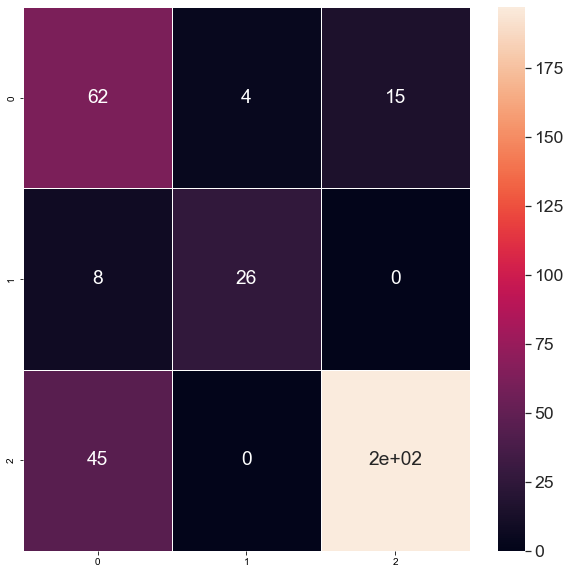

In [22]:
#Print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_labels, test_prediction)

fig, ax = plt.subplots(figsize=(10,10))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

[0.70296304] [0.95458318] [6.32423937] [0.7382121] [421.16065996] 2.9480142460412893
The prediction for this image is:  ['Old']
The actual label for this image is:  Old


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

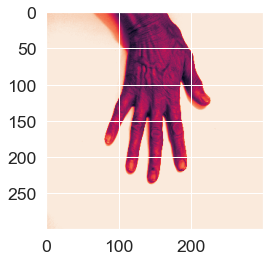

In [24]:
import random
n=random.randint(0, x_test.shape[0]-1) #Select the index of image to be loaded for testing
img = x_test[n]
plt.imshow(img)

#Extract features and reshape to right dimensions
input_img = np.expand_dims(img, axis=0) #Expand dims so the input is (num images, x, y, c)
input_img_features=feature_extractor(input_img)
input_img_features = np.expand_dims(input_img_features, axis=0)
input_img_for_RF = np.reshape(input_img_features, (input_img.shape[0], -1))
#Predict
img_prediction = lgb_model.predict(input_img_for_RF)
img_prediction=np.argmax(img_prediction, axis=1)
img_prediction = le.inverse_transform([img_prediction])  #Reverse the label encoder to original name
print("The prediction for this image is: ", img_prediction)
print("The actual label for this image is: ", test_labels[n])

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import joblib
from sklearn import svm

In [45]:
#Decision Tree Classifier
from sklearn.metrics import accuracy_score
#Assign model with Decision Tree classifier
model_dt = DecisionTreeClassifier(max_depth=13)
model_dt.fit(X_for_ML, y_train)
joblib.dump(model_dt,"model_dt")

#predicting the traget variable using testing variables
y_pred1 = model_dt.predict(test_for_RF)
#Results
print("Decision Tree Results")
print("Decision Tree Accuracy: ",accuracy_score(y_test, y_pred1)*100,"%")
print("Train Accuracy:",model_dt.score(X_for_ML, y_train))
print("Test Accuracy:",model_dt.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred1, pos_label='positive', average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred1, pos_label='positive', average='micro')) # true positive rate, Sensitivity
print("F2 Score: ",metrics.fbeta_score(y_test, y_pred1, pos_label='positive', average='micro', beta=2.0))
print("F1 Score: ",metrics.f1_score(y_test, y_pred1, pos_label='positive', average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred1))

Decision Tree Results
Decision Tree Accuracy:  67.50700280112045 %
Train Accuracy: 0.9966216216216216
Test Accuracy: 0.6750700280112045
Precision Score:  0.6750700280112045
Recall Score:  0.6750700280112045
F2 Score:  0.6750700280112045
F1 Score:  0.6750700280112045
Confusion Matrix: 
[[ 55   1  25]
 [  3  28   3]
 [ 84   0 158]]


D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignor

In [33]:
#Random Forest classifier
model_rf = RandomForestClassifier(n_estimators = 50)

model_rf.fit(X_for_ML, y_train)
joblib.dump(model_rf,"model_rf")

y_pred2 = model_rf.predict(test_for_RF)
print("Random Forest Clasifier")
print("Random Forest Accuracy: ",accuracy_score(y_test, y_pred2)*100,"%")
print("Train Accuracy:",model_rf.score(X_for_ML, y_train))
print("Test Accuracy:",model_rf.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred2, pos_label='positive', average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred2, pos_label='positive', average='micro'))
print("F1 Score: ",metrics.f1_score(y_test, y_pred2, pos_label='positive', average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred2,))

Random Forest Clasifier
Random Forest Accuracy:  81.5126050420168 %
Train Accuracy: 1.0
Test Accuracy: 0.8151260504201681
Precision Score:  0.8151260504201681
Recall Score:  0.8151260504201681
F1 Score:  0.8151260504201681
Confusion Matrix: 
[[ 62   6  13]
 [  6  27   1]
 [ 40   0 202]]


D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignor

In [34]:
#KNN classifier
model_knn = KNeighborsClassifier(n_neighbors = 5)
model_knn.fit(X_for_ML, y_train)
#joblib.dump(model_knn,"model_knn")
y_pred3 = model_knn.predict(test_for_RF)
print("KNN")
print("Train Accuracy:",model_knn.score(X_for_ML, y_train))
print("Test Accuracy:",model_knn.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred3, pos_label='positive', average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred3, pos_label='positive', average='micro'))
print("F1 Score: ",metrics.f1_score(y_test, y_pred3, pos_label='positive', average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred3,))

KNN
Train Accuracy: 0.884009009009009
Test Accuracy: 0.7647058823529411
Precision Score:  0.7647058823529411
Recall Score:  0.7647058823529411
F1 Score:  0.7647058823529412
Confusion Matrix: 
[[ 32   1  48]
 [  2  22  10]
 [ 17   6 219]]


D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored w

In [35]:
#svm classifier
model_svm = svm.SVC(kernel='linear') # Linear Kernel
model_svm.fit(X_for_ML.values, y_train)
joblib.dump(model_svm,"model_svm")
y_pred4 = model_svm.predict(test_for_RF)
print("SVM Linear kernel")
print("Train Accuracy:",model_svm.score(X_for_ML.values, y_train))
print("Test Accuracy:",model_svm.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred4, pos_label='positive', average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred4, pos_label='positive', average='micro'))
print("F1 Score: ",metrics.f1_score(y_test, y_pred4, pos_label='positive', average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred4,))

SVM Linear kernel
Train Accuracy: 0.9268018018018018
Test Accuracy: 0.7899159663865546
Precision Score:  0.7899159663865546
Recall Score:  0.7899159663865546
F1 Score:  0.7899159663865545
Confusion Matrix: 
[[ 55  24   2]
 [  2  32   0]
 [ 47   0 195]]


D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(
D:\Anaconda\lib\site-packages\sklearn\metrics\_classification.py:1370: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'micro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


In [36]:
#gaussian naive bayes classifier
model_nb = GaussianNB().fit(X_for_ML.values, y_train)
joblib.dump(model_nb,"model_nb")
y_pred8 = model_nb.predict(test_for_RF)
print("Gaussian NB")
print("Train Accuracy:",model_nb.score(X_for_ML.values, y_train))
print("Test Accuracy:",model_nb.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred8, average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred8, average='micro'))
print("F1 Score: ",metrics.f1_score(y_test, y_pred8, average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred8,))


Gaussian NB
Train Accuracy: 0.7792792792792793
Test Accuracy: 0.6918767507002801
Precision Score:  0.6918767507002801
Recall Score:  0.6918767507002801
F1 Score:  0.6918767507002801
Confusion Matrix: 
[[ 56  25   0]
 [  3  31   0]
 [ 82   0 160]]


In [28]:
#xgboost classifier
model_xgboost = XGBClassifier().fit(X_for_ML.values, y_train)
joblib.dump(model_xgboost,"model_xgboost")
y_pred5 = model_xgboost.predict(test_for_RF)
print("XGboost")
print("Train Accuracy:",model_xgboost.score(X_for_ML.values, y_train))
print("Test Accuracy:",model_xgboost.score(test_for_RF, y_test))
print("Precision Score: ",metrics.precision_score(y_test, y_pred5, average='micro'))
print("Recall Score: ",metrics.recall_score(y_test, y_pred5, average='micro'))
print("F1 Score: ",metrics.f1_score(y_test, y_pred5,  average='micro'))
print("Confusion Matrix: ")
print(confusion_matrix(y_test, y_pred5,))

XGboost
Train Accuracy: 1.0
Test Accuracy: 0.8123249299719888
Precision Score:  0.8123249299719888
Recall Score:  0.8123249299719888
F1 Score:  0.8123249299719888
Confusion Matrix: 
[[ 68   2  11]
 [  9  25   0]
 [ 45   0 197]]


In [30]:
import random

fig = plt.figure(figsize=(25, 8.5))

l = random.sample(range(0,50), 8)

for i in range(1,9):
    n = l[i-1]
    img = x_test[n]
    
    image = rgb_test_images[n]

    #Extract features and reshape to right dimensions
    input_img = np.expand_dims(img, axis=0) #Expand dims so the input is (num images, x, y, c)
    input_img_features=feature_extractor(input_img)
    input_img_features = np.expand_dims(input_img_features, axis=0)
    input_img_for_RF = np.reshape(input_img_features, (input_img.shape[0], -1))
    #Predict
    img_prediction = model_xgboost.predict(input_img_for_RF)
    img_prediction=np.argmax(img_prediction, axis=1)
    img_prediction = str(le.inverse_transform([img_prediction]))  #Reverse the label encoder to original name
    
    
    fig.add_subplot(2,4,i)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f'Actual label: {test_labels[n]}\nPredicted label: {img_prediction[2:-1]}')

[0.67032451] [0.96495029] [5.64885906] [0.70437322] [281.41136465] 3.1749585167461434


D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
D:\Anaconda\lib\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Fun

AxisError: axis 1 is out of bounds for array of dimension 1

<Figure size 1800x612 with 0 Axes>